# Ampere Analysis Notebook

This notebook demonstrates how to load HPL traces using the `ampere` library and visualize energy consumption.
Now running on **Arkouda** for scalable server-side processing.

In [1]:
from IPython.display import display
import re
from ampere import Ensemble, Metric, MetricConfig, MetricType, AmpereSession, Visualizer, connect, DataFrame, set_backend, ak
import numpy as np
from scipy.stats import binned_statistic
from scipy.optimize import minimize_scalar
import matplotlib.pyplot as plt
from matplotlib.ticker import (MultipleLocator, AutoMinorLocator)

import os
from glob import glob
# Connect to Arkouda (registers cleanup automatically)
set_backend('pandas')
connect(server="localhost", port=5555)

    _         _                   _       
   / \   _ __| | _____  _   _  __| | __ _ 
  / _ \ | '__| |/ / _ \| | | |/ _` |/ _` |
 / ___ \| |  |   < (_) | |_| | (_| | (_| |
/_/   \_\_|  |_|\_\___/ \__,_|\__,_|\__,_|
                                          
Client Version: 2026.02.02+40.gec39a6ec8Pandas backend active — skipping Arkouda connection.


In [2]:
# TRACES=[
#     "/Users/adam/Documents/python/ampere/examples/gemm-traces-9/cycles-1",
#     "/Users/adam/Documents/python/ampere/examples/gemm-traces-9/cycles-4",
#     "/Users/adam/Documents/python/ampere/examples/gemm-traces-9/cycles-16",
#     "/Users/adam/Documents/python/ampere/examples/gemm-traces-9/cycles-64",
#     "/Users/adam/Documents/python/ampere/examples/gemm-traces-9/cycles-128",
#     "/Users/adam/Documents/python/ampere/examples/gemm-traces-9/cycles-256",
#     "/Users/adam/Documents/python/ampere/examples/gemm-traces-9/cycles-512",
#     "/Users/adam/Documents/python/ampere/examples/gemm-traces-9/cycles-1024",
#     "/Users/adam/Documents/python/ampere/examples/gemm-traces-9/cycles-2048",
#     "/Users/adam/Documents/python/ampere/examples/gemm-traces-9/cycles-4096",
#     "/Users/adam/Documents/python/ampere/examples/gemm-traces-9/cycles-8192",
# ]
TRACES=sorted([str(x) for x in glob("/Users/hom/Documents/ampere/examples/mi300a-arithmetic-square-wave-04-29-26-14:55:24/cycles-*")], key=lambda s: int(s.split('-')[-1]))
TRACES

['/Users/hom/Documents/ampere/examples/mi300a-arithmetic-square-wave-04-29-26-14:55:24/cycles-1',
 '/Users/hom/Documents/ampere/examples/mi300a-arithmetic-square-wave-04-29-26-14:55:24/cycles-2',
 '/Users/hom/Documents/ampere/examples/mi300a-arithmetic-square-wave-04-29-26-14:55:24/cycles-3',
 '/Users/hom/Documents/ampere/examples/mi300a-arithmetic-square-wave-04-29-26-14:55:24/cycles-4',
 '/Users/hom/Documents/ampere/examples/mi300a-arithmetic-square-wave-04-29-26-14:55:24/cycles-5',
 '/Users/hom/Documents/ampere/examples/mi300a-arithmetic-square-wave-04-29-26-14:55:24/cycles-6',
 '/Users/hom/Documents/ampere/examples/mi300a-arithmetic-square-wave-04-29-26-14:55:24/cycles-8',
 '/Users/hom/Documents/ampere/examples/mi300a-arithmetic-square-wave-04-29-26-14:55:24/cycles-10',
 '/Users/hom/Documents/ampere/examples/mi300a-arithmetic-square-wave-04-29-26-14:55:24/cycles-12',
 '/Users/hom/Documents/ampere/examples/mi300a-arithmetic-square-wave-04-29-26-14:55:24/cycles-15',
 '/Users/hom/Docu

In [3]:
for trace in TRACES:
    if not glob(os.path.join(trace, "*.csv")):
        os.system(f"cd {trace} && ~/otf2csv ./traces.otf2")

In [4]:
# Define Metric Configs
configs = {
    re.compile(r".*rocm.*energy.*"): MetricConfig(MetricType.CUMULATIVE, scale_factor=1e-6),
    re.compile(r".*rocm.*violation.*"): MetricConfig(MetricType.CUMULATIVE),
    re.compile(r".*rocm.*clk.*"): MetricConfig(MetricType.INSTANTANEOUS, scale_factor=1e-9),
    re.compile(r".*amd.*energy.*"): MetricConfig(MetricType.CUMULATIVE, scale_factor=1e-6),
    re.compile(r".*amd.*violation.*"): MetricConfig(MetricType.CUMULATIVE),
    re.compile(r".*amd.*clk.*"): MetricConfig(MetricType.INSTANTANEOUS, scale_factor=1e-9),
}

# Define Topology Resolver
def my_hpc_topology(metric_name, ranks):
    # if 'device=4' in metric_name: return [r for r in ranks if r.name in ['MPI Rank 0', 'MPI Rank 1']]
    # if 'device=2' in metric_name: return [r for r in ranks if r.name in ['MPI Rank 2', 'MPI Rank 3']]
    # if 'device=6' in metric_name: return [r for r in ranks if r.name in ['MPI Rank 4', 'MPI Rank 5']]
    # if 'device=0' in metric_name: return [r for r in ranks if r.name in ['MPI Rank 6', 'MPI Rank 7']]
    # if 'device=0' in metric_name: return [r for r in ranks if r.name in ['MPI Rank 0']]
    # if 'device=1' in metric_name: return [r for r in ranks if r.name in ['MPI Rank 0']]
    # if 'device=2' in metric_name: return [r for r in ranks if r.name in ['MPI Rank 0']]
    # if 'device=3' in metric_name: return [r for r in ranks if r.name in ['MPI Rank 0']]
    return ranks

In [5]:
# ranks = [f"MPI Rank {i}" for i in range(8)]
ranks = ["Process"]
topo = {"Node0": ranks}
ensemble = Ensemble.from_trace_paths(TRACES, topo, configs)


Loading Runs: 100%|██████████| 32/32 [00:00<00:00, 50.84it/s]


In [6]:
TRACE_NUMBER=0

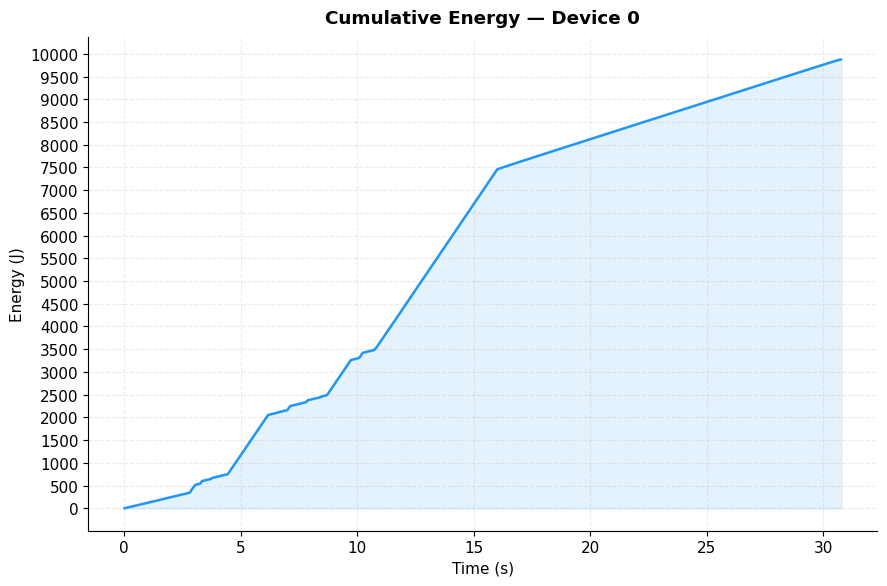

In [7]:
# Shared constants used by all subsequent plots
TDP = 560        # W
THROTTLE_LOW, THROTTLE_HIGH = 0.8, 1.7  # GHz (throttle detection band)
PALETTE = plt.cm.plasma(np.linspace(0.15, 0.88, len(TRACES)))

plt.rcParams.update({
    'axes.spines.top':   False,
    'axes.spines.right': False,
    'axes.grid':         True,
    'grid.alpha':        0.25,
    'grid.linestyle':    '--',
    'font.size':         11,
})

# --- Cumulative energy: first run, device 0 ---
y = ensemble.runs[TRACE_NUMBER].nodes[0].metrics["A2amd_smi:::energy_consumed:device=0"]
t = np.asarray(y.times)
e = np.asarray(y.values); e -= e[0]

fig, ax = plt.subplots(figsize=(9, 6))
ax.plot(t, e, color='#2196F3', linewidth=1.8, solid_capstyle='round')
ax.fill_between(t, e, alpha=0.12, color='#2196F3')
ax.set_xlabel("Time (s)")
ax.set_ylabel("Energy (J)")
ax.set_title(f"Cumulative Energy — Device 0",
             fontweight='bold', pad=10)
ax.yaxis.set_major_locator(MultipleLocator(500))
plt.tight_layout()
plt.show()

In [8]:
# Shared constants used by all subsequent plots
cycle_counts = [int(t.split('cycles-')[-1]) for t in TRACES]

plt.rcParams.update({
    'axes.spines.top':   False,
    'axes.spines.right': False,
    'axes.grid':         True,
    'grid.alpha':        0.25,
    'grid.linestyle':    '--',
    'font.size':         11,
})

# --- Cumulative energy: first run, device 0 ---
if "A2coretemp:::craypm:power" in ensemble.runs[TRACE_NUMBER].nodes[0].metrics:
    y = ensemble.runs[TRACE_NUMBER].nodes[0].metrics["A2coretemp:::craypm:power"]
    t = np.asarray(y.times)
    e = np.asarray(y.values)

    fig, ax = plt.subplots(figsize=(18, 9))
    ax.scatter(t, e, color='#2196F3')
    # ax.plot(t, e, color='#2196F3', linewidth=1.8, solid_capstyle='round')
    ax.axhline(560 * 4, label='Combined GPU TDP', color='red')
    ax.axhline(560 * 4 + 280, label='Combined GPU + CPU TDP', color='coral')
    ax.fill_between(t, e, alpha=0.12, color='#2196F3')
    ax.set_xlabel("Time (s)")
    ax.set_ylabel("Power (W)")
    ax.set_title(f"Node Power",
                fontweight='bold', pad=10)
    ax.grid(True, which='both')

    ax.yaxis.set_major_locator(MultipleLocator(100))
    ax.xaxis.set_major_locator(MultipleLocator(5))
    ax.set_xbound(0)
    ax.set_ybound(0)


    # For the minor ticks, use no labels; default NullFormatter.
    ax.xaxis.set_minor_locator(AutoMinorLocator())
    plt.legend()
    plt.tight_layout()
    plt.show()

In [9]:

# Derive instantaneous power from cumulative energy
def calc_power(energy_metric):
    # def numerical_derivative(func, h=0.001):
    #     return lambda t: (func(t + h) - func(t - h)) / (2 * h)
    # t = energy_metric.times.to_ndarray()
    # e = energy_metric.values.to_ndarray()
    # f = lambda x: np.interp(x, t, e)
    # f = numerical_derivative(f)
    # power = f(t)
    # return Metric("power", ak.array(t), ak.array(power), MetricConfig(MetricType.INSTANTANEOUS))
    
    t = energy_metric.times
    e = energy_metric.values
    dt = t[1:] - t[:-1]
    de = e[1:] - e[:-1]
    power = de / dt
    power = ak.where((power < 0) | (dt <= 0), 0.0, power)
    return Metric("power", t[1:], power, MetricConfig(MetricType.INSTANTANEOUS))

for d in [0, 1, 2, 3]:
    ensemble.add_derived_metric(
        f"A2amd_smi:::inst_power:device={d}",
        calc_power,
        f"A2amd_smi:::energy_consumed:device={d}"
    )

    ensemble.add_derived_metric(
        f"A2amd_smi:::inst_slew:device={d}",
        calc_power,
        f"A2amd_smi:::inst_power:device={d}"
    )

Deriving metric 'A2amd_smi:::inst_power:device=0'...
Deriving metric 'A2amd_smi:::inst_slew:device=0'...
Deriving metric 'A2amd_smi:::inst_power:device=1'...
Deriving metric 'A2amd_smi:::inst_slew:device=1'...
Deriving metric 'A2amd_smi:::inst_power:device=2'...
Deriving metric 'A2amd_smi:::inst_slew:device=2'...
Deriving metric 'A2amd_smi:::inst_power:device=3'...
Deriving metric 'A2amd_smi:::inst_slew:device=3'...


In [10]:
def calc_combined_gpu_power(*power_metrics):
    values = []
    lens = [len(metric.times) for metric in power_metrics]
    l = min(lens)
    for i in range(l):
        values.append(sum([metric.values[i] for metric in power_metrics]))
    times = None
    for metric in power_metrics:
        if times is None or len(metric.times) < len(times):
            times = metric.times
    return Metric('combined_gpu_power', times, np.array(values), MetricConfig(MetricType.INSTANTANEOUS))

ensemble.add_derived_metric(
    f"A2amd_smi:::combined_gpu_power",
    calc_combined_gpu_power,
    f"A2amd_smi:::inst_power:device=0",
    f"A2amd_smi:::inst_power:device=1",
    f"A2amd_smi:::inst_power:device=2",
    f"A2amd_smi:::inst_power:device=3",
)

Deriving metric 'A2amd_smi:::combined_gpu_power'...


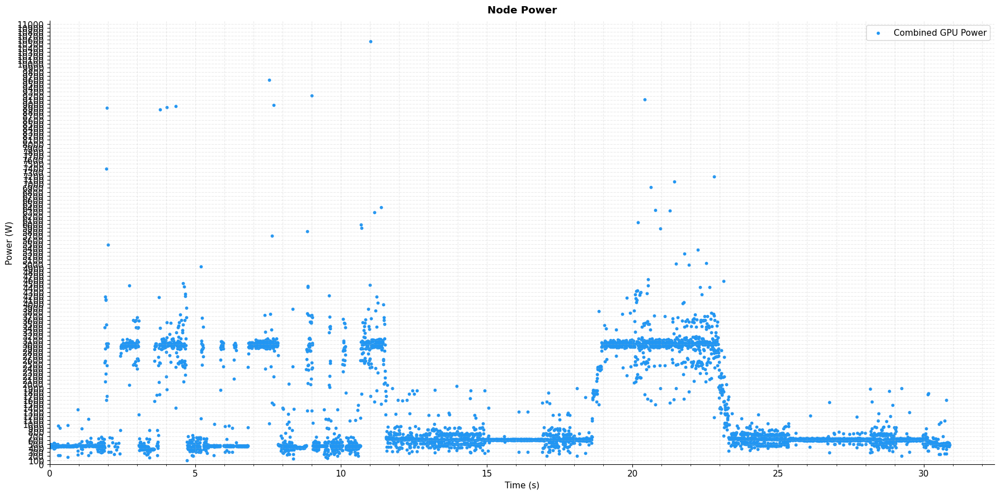

In [11]:
# Shared constants used by all subsequent plots
# cycle_counts = [int(t.split('cycles-')[-1]) for t in TRACES]
TRACE_NUMBER=1
plt.rcParams.update({
    'axes.spines.top':   False,
    'axes.spines.right': False,
    'axes.grid':         True,
    'grid.alpha':        0.25,
    'grid.linestyle':    '--',
    'font.size':         11,
})

# --- Cumulative energy: first run, device 0 ---
fig, ax = plt.subplots(figsize=(18, 9))
y = ensemble.runs[TRACE_NUMBER].nodes[0].metrics["A2amd_smi:::combined_gpu_power"]
t = np.asarray(y.times)
e = np.asarray(y.values)
ax.scatter(t, e, color='#2196F3', label='Combined GPU Power', s=10)
if "A2coretemp:::craypm:power" in ensemble.runs[TRACE_NUMBER].nodes[0].metrics:
    y = ensemble.runs[TRACE_NUMBER].nodes[0].metrics["A2coretemp:::craypm:power"]
    t = np.asarray(y.times)
    e = np.asarray(y.values)
    ax.scatter(t, e, color='red', label='Node Power')
ax.set_xlabel("Time (s)")
ax.set_ylabel("Power (W)")
ax.set_title(f"Node Power",
             fontweight='bold', pad=10)
ax.grid(True, which='both')

# ax.axhline(560 * 4, label='Combined GPU TDP', color='green')
# ax.axhline(560 * 4 + 280, label='Combined GPU + CPU TDP', color='coral')
ax.yaxis.set_major_locator(MultipleLocator(100))
ax.xaxis.set_major_locator(MultipleLocator(5))
ax.set_xbound(0)
ax.set_ybound(0)


# For the minor ticks, use no labels; default NullFormatter.
ax.xaxis.set_minor_locator(AutoMinorLocator())
plt.legend()
plt.tight_layout()
plt.show()

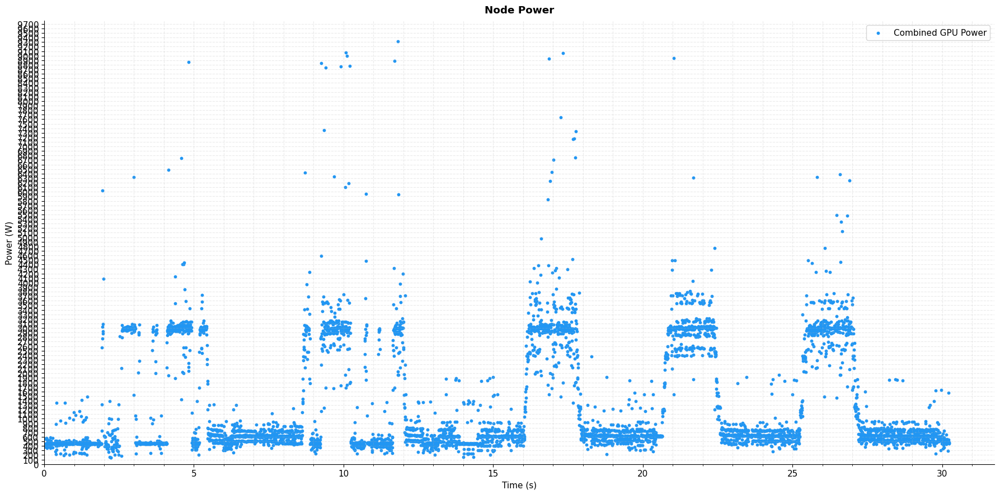

In [12]:
# Shared constants used by all subsequent plots
# cycle_counts = [int(t.split('cycles-')[-1]) for t in TRACES]
TRACE_NUMBER=4

plt.rcParams.update({
    'axes.spines.top':   False,
    'axes.spines.right': False,
    'axes.grid':         True,
    'grid.alpha':        0.25,
    'grid.linestyle':    '--',
    'font.size':         11,
})

# --- Cumulative energy: first run, device 0 ---
fig, ax = plt.subplots(figsize=(18, 9))
y = ensemble.runs[TRACE_NUMBER].nodes[0].metrics["A2amd_smi:::combined_gpu_power"]
t = np.asarray(y.times)
e = np.asarray(y.values)
ax.scatter(t, e, color='#2196F3', label='Combined GPU Power', s=10)
if "A2coretemp:::craypm:power" in ensemble.runs[TRACE_NUMBER].nodes[0].metrics:
    y = ensemble.runs[TRACE_NUMBER].nodes[0].metrics["A2coretemp:::craypm:power"]
    t = np.asarray(y.times)
    e = np.asarray(y.values)
    ax.scatter(t, e, color='red', label='Node Power')
ax.set_xlabel("Time (s)")
ax.set_ylabel("Power (W)")
ax.set_title(f"Node Power",
             fontweight='bold', pad=10)
ax.grid(True, which='both')

# ax.axhline(560 * 4, label='Combined GPU TDP', color='green')
# ax.axhline(560 * 4 + 280, label='Combined GPU + CPU TDP', color='coral')
ax.yaxis.set_major_locator(MultipleLocator(100))
ax.xaxis.set_major_locator(MultipleLocator(5))
ax.set_xbound(0)
ax.set_ybound(0)


# For the minor ticks, use no labels; default NullFormatter.
ax.xaxis.set_minor_locator(AutoMinorLocator())
plt.legend()
plt.tight_layout()
plt.show()

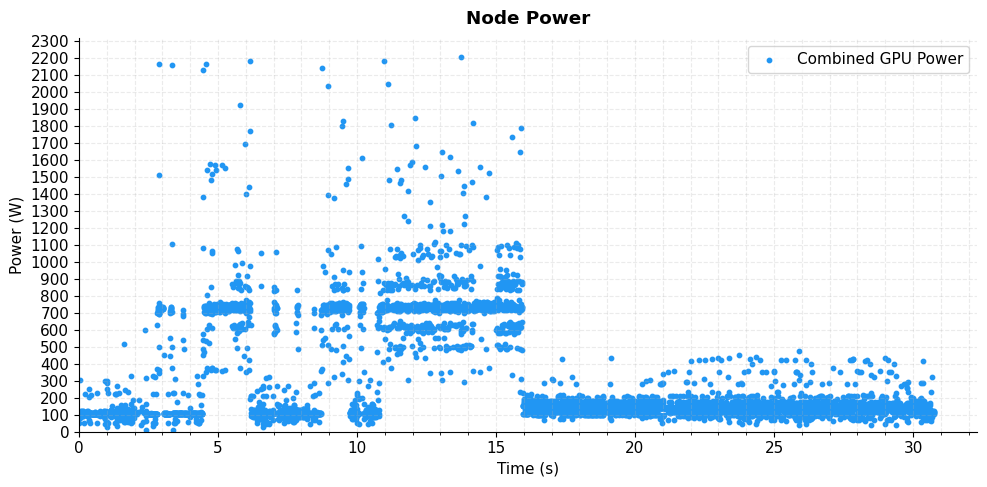

In [13]:
# Shared constants used by all subsequent plots
# cycle_counts = [int(t.split('cycles-')[-1]) for t in TRACES]
TRACE_NUMBER=0
# TRACE_NUMBER=23

plt.rcParams.update({
    'axes.spines.top':   False,
    'axes.spines.right': False,
    'axes.grid':         True,
    'grid.alpha':        0.25,
    'grid.linestyle':    '--',
    'font.size':         11,
})

# --- Cumulative energy: first run, device 0 ---
fig, ax = plt.subplots(figsize=(10, 5))
y = ensemble.runs[TRACE_NUMBER].nodes[0].metrics["A2amd_smi:::inst_power:device=2"]
t = np.asarray(y.times)
e = np.asarray(y.values)
ax.scatter(t, e, color='#2196F3', label='Combined GPU Power', s=10)
if "A2coretemp:::craypm:power" in ensemble.runs[TRACE_NUMBER].nodes[0].metrics:
    y = ensemble.runs[TRACE_NUMBER].nodes[0].metrics["A2coretemp:::craypm:power"]
    t = np.asarray(y.times)
    e = np.asarray(y.values)
    ax.scatter(t, e, color='red', label='Node Power')
ax.set_xlabel("Time (s)")
ax.set_ylabel("Power (W)")
ax.set_title(f"Node Power",
             fontweight='bold', pad=10)
ax.grid(True, which='both')

# ax.axhline(560 * 4, label='Combined GPU TDP', color='green')
# ax.axhline(560 * 4 + 280, label='Combined GPU + CPU TDP', color='coral')
ax.yaxis.set_major_locator(MultipleLocator(100))
ax.xaxis.set_major_locator(MultipleLocator(5))
ax.set_xbound(0)
ax.set_ybound(0)


# For the minor ticks, use no labels; default NullFormatter.
ax.xaxis.set_minor_locator(AutoMinorLocator())
plt.legend()
plt.tight_layout()
plt.show()

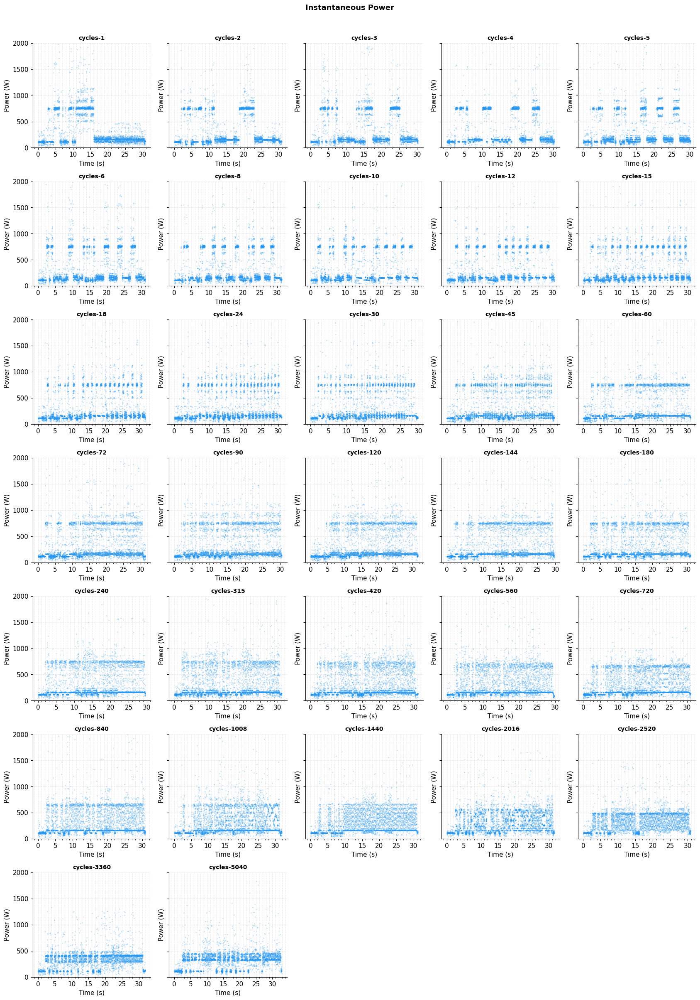

In [14]:
run_node_data     = []
run_gpu_data = []
for run in ensemble.runs:
    y_p = run.nodes[0].metrics["A2amd_smi:::combined_gpu_power"]
    t_p = np.asarray(y_p.times)
    p   = np.asarray(y_p.values)

    if "A2coretemp:::craypm:power" in ensemble.runs[TRACE_NUMBER].nodes[0].metrics:
        y_c = run.nodes[0].metrics["A2coretemp:::craypm:power"]
        t_c = np.asarray(y_c.times)
        c   = np.asarray(y_c.values)
        run_node_data.append(((t_p, p), (t_c, c)))
    else:
        run_node_data.append(((t_p, p), (None, None)))
    y_p = run.nodes[0].metrics["A2amd_smi:::inst_power:device=0"]
    t_p = np.asarray(y_p.times)
    p   = np.asarray(y_p.values)
    run_gpu_data.append(((t_p, p), None))


ncols = 5
nrows = (len(ensemble.runs) + ncols - 1) // ncols

# --- Power grid ---
fig, axes = plt.subplots(nrows, ncols, figsize=(17, nrows * 3.4), sharey=True)
fig.suptitle("Instantaneous Power",
             fontsize=13, fontweight='bold', y=1.01)
for i, (ax, _) in enumerate(zip(axes.flat, cycle_counts)):
    ax.set_title(f"cycles-{cycle_counts[i]}", fontsize=10, fontweight='bold')
    y = ensemble.runs[i].nodes[0].metrics["A2amd_smi:::inst_power:device=3"]
    t = np.asarray(y.times)
    e = np.asarray(y.values)
    ax.scatter(t, e, color='#2196F3', label='Combined GPU Power', s=0.05)
    # y = ensemble.runs[TRACE_NUMBER].nodes[0].metrics["A2coretemp:::craypm:power"]
    # t = np.asarray(y.times)
    # e = np.asarray(y.values)
    # if node_t is not None:
    #     ax.scatter(node_t, node_p, color='red', label='Node Power', s=1)
    ax.set_xlabel("Time (s)")
    ax.set_ylabel("Power (W)")
    ax.grid(True, which='both')

    ax.yaxis.set_major_locator(MultipleLocator(500))
    ax.xaxis.set_major_locator(MultipleLocator(5))
    ax.set_ybound(0, 2000)
    ax.set_ylim(0, 2000)
    

    # For the minor ticks, use no labels; default NullFormatter.
    ax.xaxis.set_minor_locator(AutoMinorLocator())

for ax in axes.flat[len(run_node_data):]:
    ax.set_visible(False)
plt.tight_layout()
plt.show()


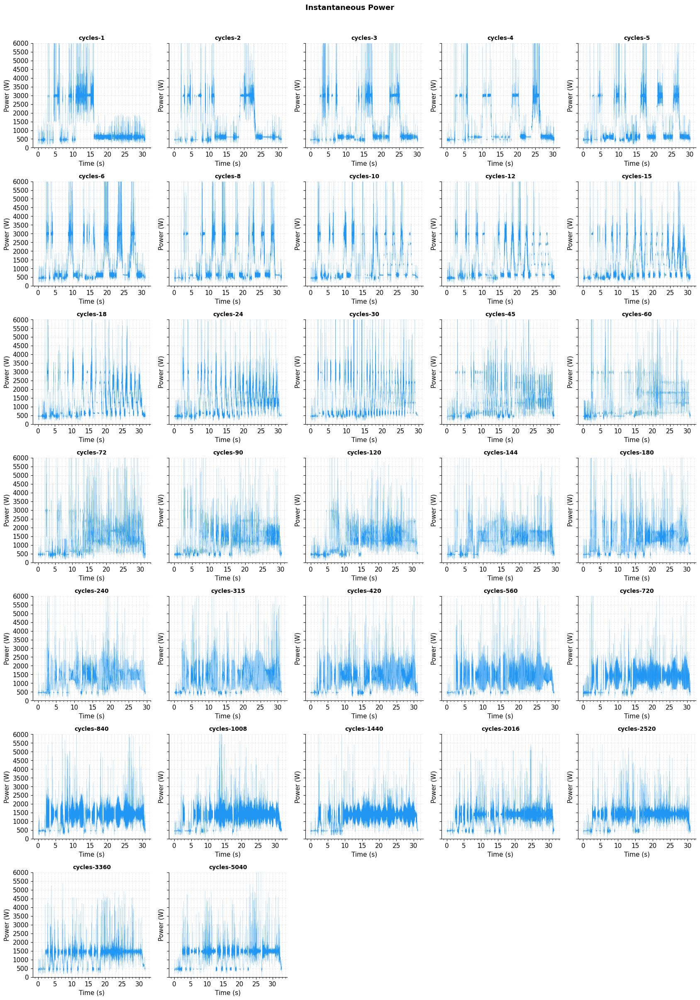

In [15]:
run_node_data     = []
run_gpu_data = []
for run in ensemble.runs:
    y_p = run.nodes[0].metrics["A2amd_smi:::combined_gpu_power"]
    t_p = np.asarray(y_p.times)
    p   = np.asarray(y_p.values)

    if "A2coretemp:::craypm:power" in ensemble.runs[TRACE_NUMBER].nodes[0].metrics:
        y_c = run.nodes[0].metrics["A2coretemp:::craypm:power"]
        t_c = np.asarray(y_c.times)
        c   = np.asarray(y_c.values)
        run_node_data.append(((t_p, p), (t_c, c)))
    else:
        run_node_data.append(((t_p, p), (None, None)))
    y_p = run.nodes[0].metrics["A2amd_smi:::inst_power:device=0"]
    t_p = np.asarray(y_p.times)
    p   = np.asarray(y_p.values)
    run_gpu_data.append(((t_p, p), None))


ncols = 5
nrows = (len(ensemble.runs) + ncols - 1) // ncols

# --- Power grid ---
fig, axes = plt.subplots(nrows, ncols, figsize=(17, nrows * 3.4), sharey=True)
fig.suptitle("Instantaneous Power",
             fontsize=13, fontweight='bold', y=1.01)
for i, (ax, ((combined_gpu_t, combined_gpu_p), (node_t, node_p))) in enumerate(zip(axes.flat, run_node_data)):
    ax.set_title(f"cycles-{cycle_counts[i]}", fontsize=10, fontweight='bold')
    # y = ensemble.runs[TRACE_NUMBER].nodes[0].metrics["A2rocm_smi:::combined_gpu_power"]
    # t = np.asarray(y.times)
    # e = np.asarray(y.values)
    ax.plot(combined_gpu_t, combined_gpu_p, color='#2196F3', label='Combined GPU Power', lw=0.1)
    # y = ensemble.runs[TRACE_NUMBER].nodes[0].metrics["A2coretemp:::craypm:power"]
    # t = np.asarray(y.times)
    # e = np.asarray(y.values)
    if node_t is not None:
        ax.scatter(node_t, node_p, color='red', label='Node Power', s=1)
    ax.set_xlabel("Time (s)")
    ax.set_ylabel("Power (W)")
    ax.grid(True, which='both')

    ax.yaxis.set_major_locator(MultipleLocator(500))
    ax.xaxis.set_major_locator(MultipleLocator(5))
    ax.set_ybound(0, 6000)
    ax.set_ylim(0, 6000)
    

    # For the minor ticks, use no labels; default NullFormatter.
    ax.xaxis.set_minor_locator(AutoMinorLocator())

for ax in axes.flat[len(run_node_data):]:
    ax.set_visible(False)
plt.tight_layout()
plt.show()


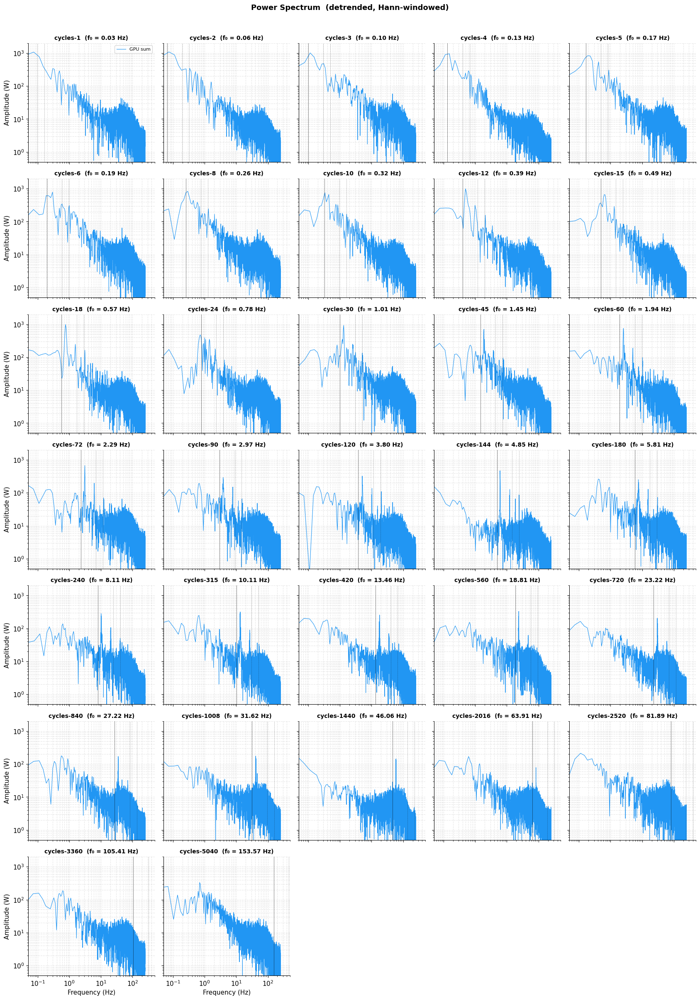

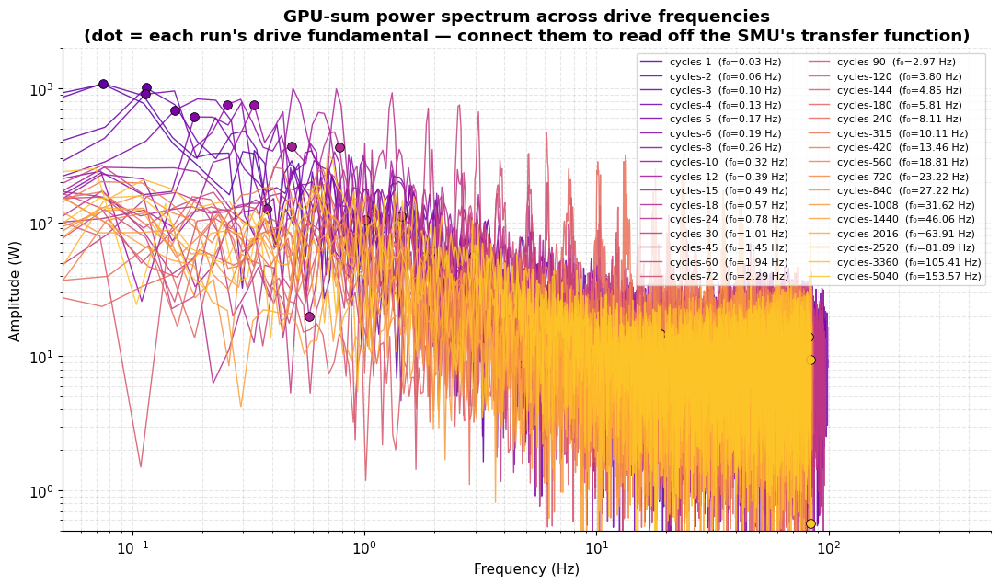

In [16]:
from scipy import signal
from matplotlib.ticker import MultipleLocator, AutoMinorLocator
import numpy as np
import matplotlib.pyplot as plt


def power_spectrum(t, p, t_skip_head=3.0, t_skip_tail=1.0, fs_max=500.0, dt=None):
    """
    Single-sided amplitude spectrum (W vs Hz) of an irregularly-sampled
    power trace. Crops warmup/cooldown, resamples uniformly, linearly
    detrends (removes DC and the thermal-leakage ramp), Hann-windows,
    and returns peak-amplitude-scaled magnitudes in Watts.
    """
    if t is None or p is None:
        return np.array([]), np.array([])

    t = np.asarray(t, dtype=float)
    p = np.asarray(p, dtype=float)
    mask = (t >= t[0] + t_skip_head) & (t <= t[-1] - t_skip_tail)
    t, p = t[mask], p[mask]
    if len(t) < 64:
        return np.array([]), np.array([])

    # Native rate from median dt; cap so node's 10 Hz signal doesn't get blown up
    if dt is None:
        dt = np.median(np.diff(t))
    fs = min(1.0 / dt, fs_max)

    t_u = np.arange(t[0], t[-1], 1.0 / fs)
    p_u = np.interp(t_u, t, p)

    p_d = signal.detrend(p_u, type='linear')
    w   = signal.windows.hann(len(p_d))
    spec = np.fft.rfft(p_d * w)
    freq = np.fft.rfftfreq(len(p_d), 1.0 / fs)

    # Peak-amplitude single-sided, with window coherent-gain correction
    mag = (2.0 / np.sum(w)) * np.abs(spec)
    return freq, mag


# ---------- Grid: per-cycle spectra, GPU + node overlaid ----------
ncols = 5
nrows = (len(ensemble.runs) + ncols - 1) // ncols

fig, axes = plt.subplots(nrows, ncols, figsize=(17, nrows * 3.4),
                         sharex=True, sharey=True)
fig.suptitle("Power Spectrum  (detrended, Hann-windowed)",
             fontsize=13, fontweight='bold', y=1.01)

for i, (ax, ((gpu_t, gpu_p), (node_t, node_p))) in enumerate(
        zip(axes.flat, run_node_data)):

    cyc = cycle_counts[i]
    duration = gpu_t[-1] - gpu_t[0]
    f0 = cyc / duration  # drive fundamental for this run

    fg, mg = power_spectrum(gpu_t,  gpu_p,  fs_max=500.0, dt=0.001)
    fn, mn = power_spectrum(node_t, node_p, fs_max=5.0)

    if len(fg):
        ax.loglog(fg[1:], mg[1:], color='#2196F3', lw=0.8,
                  label='GPU sum')
    if len(fn):
        ax.loglog(fn[1:], mn[1:], color='red', lw=0.9, alpha=0.85,
                  label='Node meter')

    # Drive fundamental + odd harmonics (square-wave content lives here)
    for k, ls in [(1, '-'), (3, ':'), (5, ':')]:
        f = k * f0
        if 0.05 < f < 500:
            ax.axvline(f, color='black', ls=ls, lw=0.7, alpha=0.5)

    ax.set_title(f"cycles-{cyc}  (f₀ = {f0:.2f} Hz)",
                 fontsize=10, fontweight='bold')
    ax.set_xlim(0.05, 500)
    ax.set_ylim(0.5, 2000)
    ax.grid(True, which='both', alpha=0.3)
    if i == 0:
        ax.legend(fontsize=8, loc='upper right')

for ax in axes[-1, :]:
    ax.set_xlabel("Frequency (Hz)")
for ax in axes[:, 0]:
    ax.set_ylabel("Amplitude (W)")
for ax in axes.flat[len(run_node_data):]:
    ax.set_visible(False)

plt.tight_layout()
plt.show()


# ---------- Overlay: all GPU spectra on one axes (the SMU envelope) ----------
fig, ax = plt.subplots(figsize=(11, 6.5))
for i, ((gpu_t, gpu_p), _) in enumerate(run_node_data):
    cyc = cycle_counts[i]
    f0 = cyc / (gpu_t[-1] - gpu_t[0])
    fg, mg = power_spectrum(gpu_t, gpu_p, fs_max=500.0)
    if not len(fg):
        continue
    ax.loglog(fg[1:], mg[1:], color=PALETTE[i], lw=1.0, alpha=0.85,
              label=f"cycles-{cyc}  (f₀={f0:.2f} Hz)")
    # Highlight the fundamental on each curve
    idx = np.argmin(np.abs(fg - f0))
    ax.plot(fg[idx], mg[idx], 'o', color=PALETTE[i],
            ms=7, mec='black', mew=0.6)

ax.set_xlabel("Frequency (Hz)")
ax.set_ylabel("Amplitude (W)")
ax.set_title("GPU-sum power spectrum across drive frequencies\n"
             "(dot = each run's drive fundamental — connect them to read off the SMU's transfer function)",
             fontweight='bold')
ax.set_xlim(0.05, 500)
ax.set_ylim(0.5, 2000)
ax.grid(True, which='both', alpha=0.3)
ax.legend(fontsize=8, loc='upper right', ncol=2)
plt.tight_layout()
plt.show()

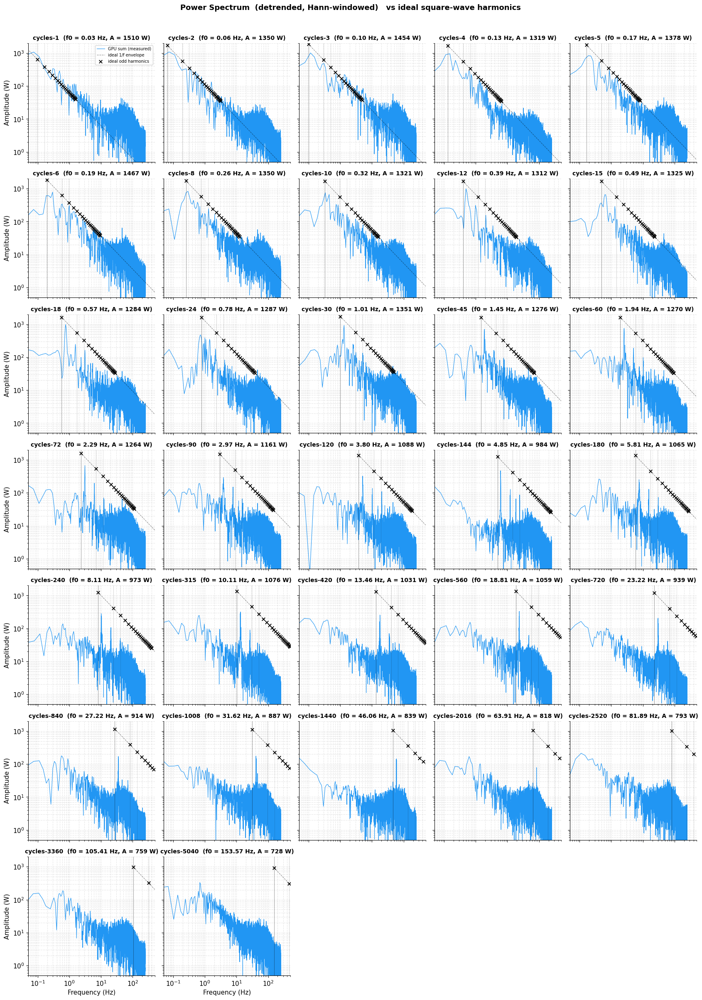

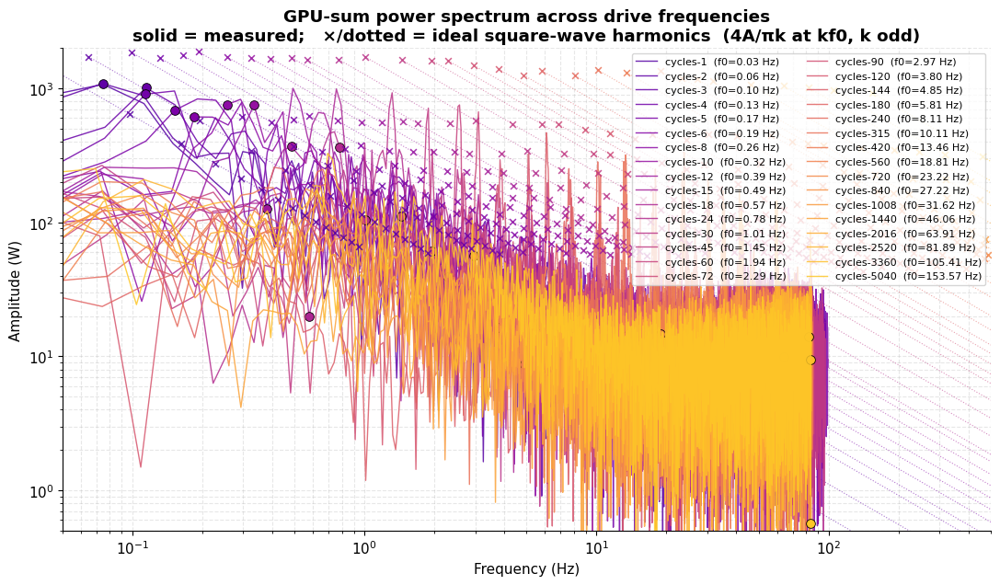

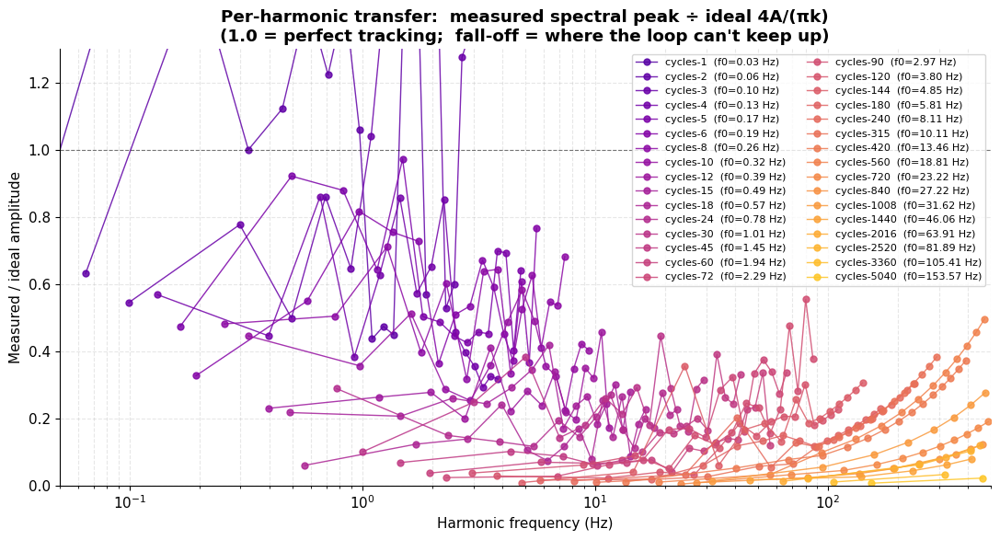

In [17]:
from scipy import signal
from matplotlib.ticker import MultipleLocator, AutoMinorLocator
import numpy as np
import matplotlib.pyplot as plt


def power_spectrum(t, p, t_skip_head=3.0, t_skip_tail=1.0, fs_max=500.0, dt=None):
    """
    Single-sided amplitude spectrum (W vs Hz) of an irregularly-sampled
    power trace. Crops warmup/cooldown, resamples uniformly, linearly
    detrends (removes DC and the thermal-leakage ramp), Hann-windows,
    and returns peak-amplitude-scaled magnitudes in Watts.
    """
    if t is None or p is None:
        return np.array([]), np.array([])

    t = np.asarray(t, dtype=float)
    p = np.asarray(p, dtype=float)
    mask = (t >= t[0] + t_skip_head) & (t <= t[-1] - t_skip_tail)
    t, p = t[mask], p[mask]
    if len(t) < 64:
        return np.array([]), np.array([])

    # Native rate from median dt; cap so node's 10 Hz signal doesn't get blown up
    if dt is None:
        dt = np.median(np.diff(t))
    fs = min(1.0 / dt, fs_max)

    t_u = np.arange(t[0], t[-1], 1.0 / fs)
    p_u = np.interp(t_u, t, p)

    p_d = signal.detrend(p_u, type='linear')
    w   = signal.windows.hann(len(p_d))
    spec = np.fft.rfft(p_d * w)
    freq = np.fft.rfftfreq(len(p_d), 1.0 / fs)

    # Peak-amplitude single-sided, with window coherent-gain correction
    mag = (2.0 / np.sum(w)) * np.abs(spec)
    return freq, mag


def square_wave_amplitude(t, p, t_skip_head=3.0, t_skip_tail=1.0):
    """
    Robust half peak-to-peak A of the square-wave portion (signal swings
    roughly between mean-A and mean+A). Uses 5/95 percentiles on the
    cropped trace so transients and outliers don't blow it up.
    """
    t = np.asarray(t, dtype=float)
    p = np.asarray(p, dtype=float)
    mask = (t >= t[0] + t_skip_head) & (t <= t[-1] - t_skip_tail)
    p = p[mask]
    if len(p) < 64:
        return 0.0
    return 0.5 * (np.percentile(p, 95) - np.percentile(p, 5))


def ideal_square_harmonics(f0, A, n_odd=25, f_max=500.0):
    """
    Fourier series of an ideal square wave of amplitude A at fundamental f0:
        a_k = 4A / (pi * k)   at   f_k = k * f0,    k = 1, 3, 5, ...
    Returns (freqs, amps, k_values) clipped to f_max.
    """
    ks = np.arange(1, 2 * n_odd, 2)  # 1, 3, 5, ...
    freqs = ks * f0
    amps  = 4.0 * A / (np.pi * ks)
    keep  = (freqs > 0) & (freqs <= f_max)
    return freqs[keep], amps[keep], ks[keep]


def measured_at(fg, mg, f_target, half_window_bins=2):
    """Local max around f_target — Hann smears each tone across ~2 bins."""
    idx = np.argmin(np.abs(fg - f_target))
    lo = max(0, idx - half_window_bins)
    hi = min(len(mg), idx + half_window_bins + 1)
    return mg[lo:hi].max()


# ---------- Grid: per-cycle spectra, GPU + node + ideal harmonics ----------
ncols = 5
nrows = (len(ensemble.runs) + ncols - 1) // ncols

fig, axes = plt.subplots(nrows, ncols, figsize=(17, nrows * 3.4),
                         sharex=True, sharey=True)
fig.suptitle("Power Spectrum  (detrended, Hann-windowed)   vs ideal square-wave harmonics",
             fontsize=13, fontweight='bold', y=1.01)

for i, (ax, ((gpu_t, gpu_p), (node_t, node_p))) in enumerate(
        zip(axes.flat, run_node_data)):

    cyc = cycle_counts[i]
    duration = gpu_t[-1] - gpu_t[0]
    f0 = cyc / duration  # drive fundamental for this run

    fg, mg = power_spectrum(gpu_t,  gpu_p,  fs_max=500.0, dt=0.001)
    fn, mn = power_spectrum(node_t, node_p, fs_max=5.0)

    if len(fg):
        ax.loglog(fg[1:], mg[1:], color='#2196F3', lw=0.8,
                  label='GPU sum (measured)')
    if len(fn):
        ax.loglog(fn[1:], mn[1:], color='red', lw=0.9, alpha=0.85,
                  label='Node meter (measured)')

    # ---- Ideal square-wave reference (Fourier series of the drive) ----
    A = square_wave_amplitude(gpu_t, gpu_p)
    if A > 0:
        fk, ak, ks = ideal_square_harmonics(f0, A, n_odd=25, f_max=500)
        # 1/f envelope: a(f) = (4A/pi) * (f0/f) — the line every odd harmonic sits on
        f_env = np.array([f0, 500.0])
        a_env = 4.0 * A / np.pi * (f0 / f_env)
        ax.loglog(f_env, a_env, color='black', ls='--', lw=0.8, alpha=0.45,
                  label='ideal 1/f envelope')
        # The discrete odd harmonics themselves
        ax.scatter(fk, ak, marker='x', color='black', s=30, lw=1.3,
                   zorder=5, label='ideal odd harmonics')
        # Faint vertical guides at fundamental, 3rd, 5th
        for k, alpha_k in [(1, 0.55), (3, 0.25), (5, 0.18)]:
            f = k * f0
            if 0.05 < f < 500:
                ax.axvline(f, color='black', lw=0.5, alpha=alpha_k)

    ax.set_title(f"cycles-{cyc}  (f0 = {f0:.2f} Hz, A = {A:.0f} W)",
                 fontsize=10, fontweight='bold')
    ax.set_xlim(0.05, 500)
    ax.set_ylim(0.5, 2000)
    ax.grid(True, which='both', alpha=0.3)
    if i == 0:
        ax.legend(fontsize=7, loc='upper right')

for ax in axes[-1, :]:
    ax.set_xlabel("Frequency (Hz)")
for ax in axes[:, 0]:
    ax.set_ylabel("Amplitude (W)")
for ax in axes.flat[len(run_node_data):]:
    ax.set_visible(False)

plt.tight_layout()
plt.show()


# ---------- Overlay: all GPU spectra + their ideal harmonic stacks ----------
fig, ax = plt.subplots(figsize=(11, 6.5))
for i, ((gpu_t, gpu_p), _) in enumerate(run_node_data):
    cyc = cycle_counts[i]
    f0 = cyc / (gpu_t[-1] - gpu_t[0])
    fg, mg = power_spectrum(gpu_t, gpu_p, fs_max=500.0)
    if not len(fg):
        continue
    color = PALETTE[i]
    ax.loglog(fg[1:], mg[1:], color=color, lw=1.0, alpha=0.85,
              label=f"cycles-{cyc}  (f0={f0:.2f} Hz)")

    # Highlight the measured fundamental
    idx = np.argmin(np.abs(fg - f0))
    ax.plot(fg[idx], mg[idx], 'o', color=color,
            ms=7, mec='black', mew=0.6)

    # Ideal odd-harmonic stack + 1/f envelope for this run, same color
    A = square_wave_amplitude(gpu_t, gpu_p)
    if A > 0:
        fk, ak, _ = ideal_square_harmonics(f0, A, n_odd=15, f_max=500)
        f_env = np.array([f0, 500.0])
        a_env = 4.0 * A / np.pi * (f0 / f_env)
        ax.loglog(f_env, a_env, color=color, ls=':', lw=0.8, alpha=0.55)
        ax.scatter(fk, ak, marker='x', color=color, s=24, lw=1.1,
                   alpha=0.85, zorder=5)

ax.set_xlabel("Frequency (Hz)")
ax.set_ylabel("Amplitude (W)")
ax.set_title("GPU-sum power spectrum across drive frequencies\n"
             "solid = measured;   ×/dotted = ideal square-wave harmonics  (4A/πk at kf0, k odd)",
             fontweight='bold')
ax.set_xlim(0.05, 500)
ax.set_ylim(0.5, 2000)
ax.grid(True, which='both', alpha=0.3)
ax.legend(fontsize=8, loc='upper right', ncol=2)
plt.tight_layout()
plt.show()


# ---------- SMU response: measured / ideal at each odd harmonic ----------
fig, ax = plt.subplots(figsize=(11, 6.0))
for i, ((gpu_t, gpu_p), _) in enumerate(run_node_data):
    cyc = cycle_counts[i]
    f0 = cyc / (gpu_t[-1] - gpu_t[0])
    fg, mg = power_spectrum(gpu_t, gpu_p, fs_max=500.0)
    A = square_wave_amplitude(gpu_t, gpu_p)
    if not len(fg) or A <= 0:
        continue

    fk, ak, ks = ideal_square_harmonics(f0, A, n_odd=15, f_max=500)
    measured = np.array([measured_at(fg, mg, f) for f in fk])
    ratio = measured / ak  # 1.0 = SMU tracks that harmonic perfectly

    ax.semilogx(fk, ratio, '-o', color=PALETTE[i], lw=1.0, ms=5,
                alpha=0.85, label=f"cycles-{cyc}  (f0={f0:.2f} Hz)")

ax.axhline(1.0, color='black', lw=0.8, alpha=0.5, ls='--')
ax.set_xlabel("Harmonic frequency (Hz)")
ax.set_ylabel("Measured / ideal amplitude")
ax.set_title("Per-harmonic transfer:  measured spectral peak ÷ ideal 4A/(πk)\n"
             "(1.0 = perfect tracking;  fall-off = where the loop can't keep up)",
             fontweight='bold')
ax.set_xlim(0.05, 500)
ax.set_ylim(0, 1.3)
ax.grid(True, which='both', alpha=0.3)
ax.legend(fontsize=8, loc='upper right', ncol=2)
plt.tight_layout()
plt.show()

[np.float64(0.03252194589387985), np.float64(0.06479269545646034), np.float64(0.09922845856064785), np.float64(0.13182938844229491), np.float64(0.1654406707415213), np.float64(0.1930481489373097), np.float64(0.2552183174242964), np.float64(0.32343364539291153), np.float64(0.394242267240304), np.float64(0.4865936048643717), np.float64(0.5668155144176019), np.float64(0.7758850182603003), np.float64(1.0055730952443256), np.float64(1.4487865459198663), np.float64(1.943789287447724), np.float64(2.2914168058564095), np.float64(2.969069361944532), np.float64(3.7958226975166185), np.float64(4.851702681785455), np.float64(5.812501501514758), np.float64(8.107732017096229), np.float64(10.106614377151743), np.float64(13.457825272737326), np.float64(18.813103830647773), np.float64(23.224749355261153), np.float64(27.22002098042261), np.float64(31.618065295454773), np.float64(46.064432747676406), np.float64(63.913575628380364), np.float64(81.88844739547056), np.float64(105.40734391675258), np.float64

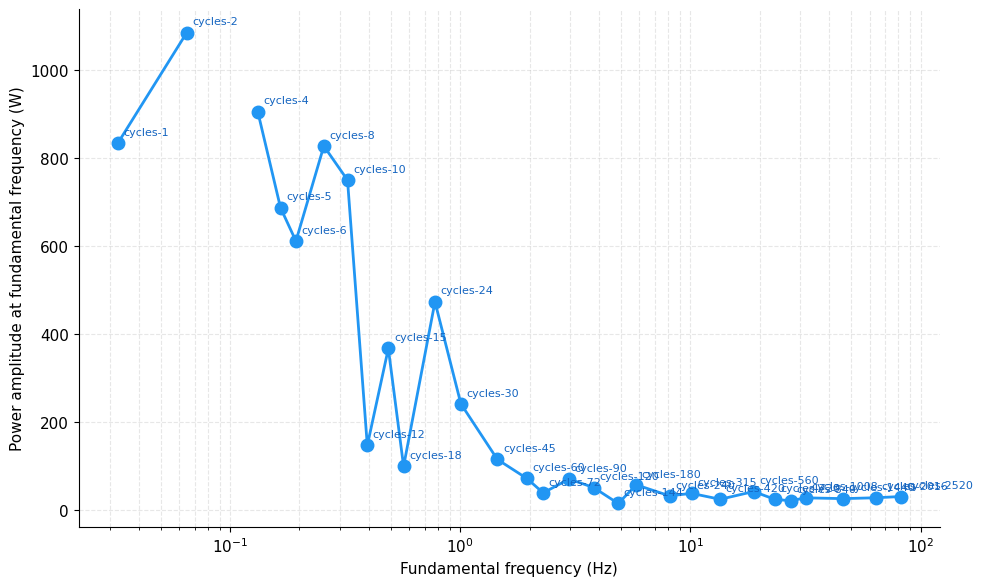

In [18]:
def amplitude_at(freq_arr, mag_arr, target_f, tol=0.15):
    """Return peak magnitude in a +/-tol*target_f window around target_f."""
    if len(freq_arr) == 0:
        return np.nan
    lo, hi = target_f * (1 - tol), target_f * (1 + tol)
    band = (freq_arr >= lo) & (freq_arr <= hi)
    if not band.any():
        return np.nan
    return mag_arr[band].max()


fund_freqs = []
fund_amps_gpu = []
fund_amps_node = []

for i, ((gpu_t, gpu_p), (node_t, node_p)) in enumerate(run_node_data):
    f0 = cycle_counts[i] / (gpu_t[-1] - gpu_t[0])
    fg, mg = power_spectrum(gpu_t,  gpu_p,  fs_max=500.0)
    fn, mn = power_spectrum(node_t, node_p, fs_max=5.0)
    fund_freqs.append(f0)
    fund_amps_gpu.append(amplitude_at(fg, mg, f0))
    fund_amps_node.append(amplitude_at(fn, mn, f0))
print(fund_freqs)
print(fund_amps_gpu)
fig, ax = plt.subplots(figsize=(10, 6))

ax.plot(fund_freqs, fund_amps_gpu, 'o-', color='#2196F3',
          lw=2, ms=9)
# ax.loglog(fund_freqs, fund_amps_node, 's-', color='red',
#           lw=2, ms=8, alpha=0.85, label='Node meter (Cray PM)')

# Annotate each point with cycle count
for f, a, c in zip(fund_freqs, fund_amps_gpu, cycle_counts):
    if not np.isnan(a):
        ax.annotate(f"cycles-{c}", xy=(f, a),
                    xytext=(4, 6), textcoords='offset points',
                    fontsize=8, color='#1565C0')

# Reference: ideal square-wave fundamental amplitude (4A/pi).
# Pick A from your data — roughly the steady-state hot-cold swing of the GPU sum.
A_swing = 750  # half the peak-to-peak swing in the time domain (W)
ideal = 4 * A_swing / np.pi
# ax.axhline(ideal, color='black', ls='--', lw=1, alpha=0.5,
#            label=f'Ideal pass-through (4A/π = {ideal:.0f} W)')

ax.set_xlabel("Fundamental frequency (Hz)")
ax.set_ylabel("Power amplitude at fundamental frequency (W)")
ax.xaxis.set_minor_locator(MultipleLocator(1))
ax.set_xbound(0)

ax.set_xscale('log', base=10)

# ax.set_title("SMU control-loop frequency response\n"
#              "(amplitude transmitted at each drive frequency)",
#              fontweight='bold')
ax.grid(True, which='both', alpha=0.3)
# ax.legend(loc='lower left')
plt.tight_layout()
plt.show()

In [19]:
# import numpy as np
# import matplotlib.pyplot as plt

# # Convert cycles to phase length in milliseconds
# phase_ms = np.array([
#     (gt[-1] - gt[0]) * 1000.0 / (2 * c)
#     for c, ((gt, _), _) in zip(cycle_counts, run_node_data)
# ])

# A = np.array(fund_amps_gpu)
# mask = ~np.isnan(A) & (A > 0)

# fig, ax = plt.subplots(figsize=(13, 7))
# ax.semilogx(phase_ms[mask], A[mask], 'o-',
#             color='#2196F3', lw=2, ms=11)

# for pm, a, c in zip(phase_ms[mask], A[mask],
#                      np.array(cycle_counts)[mask]):
#     ax.annotate(f'cycles-{c}\n({pm:.0f} ms)', xy=(pm, a),
#                 xytext=(8, 8), textcoords='offset points', fontsize=8)

# # Three regions, framed in latency terms
# ax.axvspan(1, 8,    alpha=0.12, color='red')
# ax.axvspan(8, 120,  alpha=0.12, color='orange')
# ax.axvspan(120, 1e5, alpha=0.12, color='green')

# ax.text(3, 1700,
#         'Phase < 8 ms\nController never\nreacts in time\n→ small swings',
#         ha='center', fontweight='bold', color='darkred', fontsize=10)
# ax.text(35, 1700,
#         'Phase 8–120 ms\nPartial reaction\n→ medium swings',
#         ha='center', fontweight='bold', color='darkorange', fontsize=10)
# ax.text(2000, 1700,
#         'Phase > 120 ms\nController fully\nclamps each phase\n→ full swings',
#         ha='center', fontweight='bold', color='darkgreen', fontsize=10)

# ax.set_xlabel('Length of each hot/cold phase (ms, log scale)', fontsize=12)
# ax.set_ylabel('Size of power swing (W)', fontsize=12)
# ax.set_title('How big does the GPU power swing get, as a function of how long each phase lasts?',
#              fontweight='bold', fontsize=12)
# ax.grid(True, which='both', alpha=0.3)
# plt.tight_layout()
# plt.show()

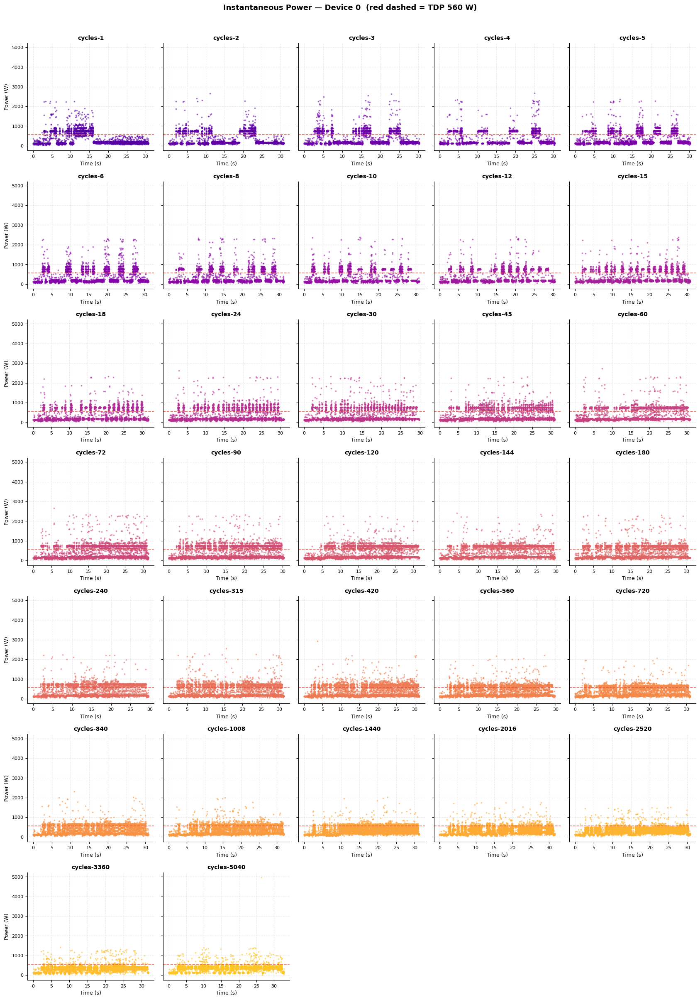

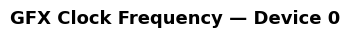

In [20]:
pct_above_tdp      = []
avg_power          = []
pct_time_throttled = []   # filled correctly in the next cell after threshold is known
run_power_data     = []
run_clock_data     = []

for run in ensemble.runs:
    y_p = run.nodes[0].metrics["A2amd_smi:::inst_power:device=0"]
    t_p = np.asarray(y_p.times)
    p   = np.asarray(y_p.values)
    pct_above_tdp.append(float(np.mean(p > TDP)))
    avg_power.append(float(p[p > TDP].mean()) if np.any(p > TDP) else TDP)
    run_power_data.append((t_p, p))

    if "A2rocm_smi:::gpu_clk_freq_System:device=0:current" in run.nodes[0].metrics:
        y_c = run.nodes[0].metrics["A2rocm_smi:::gpu_clk_freq_System:device=0:current"]
        t_c = np.asarray(y_c.times)
        c   = np.asarray(y_c.values)
        run_clock_data.append((t_c, c))

ncols = 5
nrows = (len(ensemble.runs) + ncols - 1) // ncols

# --- Power grid ---
fig, axes = plt.subplots(nrows, ncols, figsize=(17, nrows * 3.4), sharey=True)
fig.suptitle("Instantaneous Power — Device 0  (red dashed = TDP 560 W)",
             fontsize=13, fontweight='bold', y=1.01)
for i, (ax, (t, p)) in enumerate(zip(axes.flat, run_power_data)):
    ax.scatter(t, p, s=3, alpha=0.45, color=PALETTE[i], rasterized=True)
    ax.axhline(TDP, color='#e74c3c', linewidth=1.2, linestyle='--', alpha=0.85)
    ax.set_title(f"cycles-{cycle_counts[i]}", fontsize=10, fontweight='bold')
    ax.set_xlabel("Time (s)", fontsize=9)
    ax.tick_params(labelsize=8)
    if i % ncols == 0:
        ax.set_ylabel("Power (W)", fontsize=9)
for ax in axes.flat[len(run_power_data):]:
    ax.set_visible(False)
plt.tight_layout()
plt.show()

# --- Clock grid ---
fig, axes = plt.subplots(nrows, ncols, figsize=(17, nrows * 3.4), sharey=True)
fig.suptitle("GFX Clock Frequency — Device 0",
             fontsize=13, fontweight='bold', y=1.01)
for i, (ax, (t, c)) in enumerate(zip(axes.flat, run_clock_data)):
    ax.scatter(t, c, s=3, alpha=0.45, color=PALETTE[i], rasterized=True)
    ax.set_title(f"cycles-{cycle_counts[i]}", fontsize=10, fontweight='bold')
    ax.set_xlabel("Time (s)", fontsize=9)
    ax.tick_params(labelsize=8)
    if i % ncols == 0:
        ax.set_ylabel("GFX Clock (GHz)", fontsize=9)
for ax in axes.flat[len(run_clock_data):]:
    ax.set_visible(False)
plt.tight_layout()
plt.show()

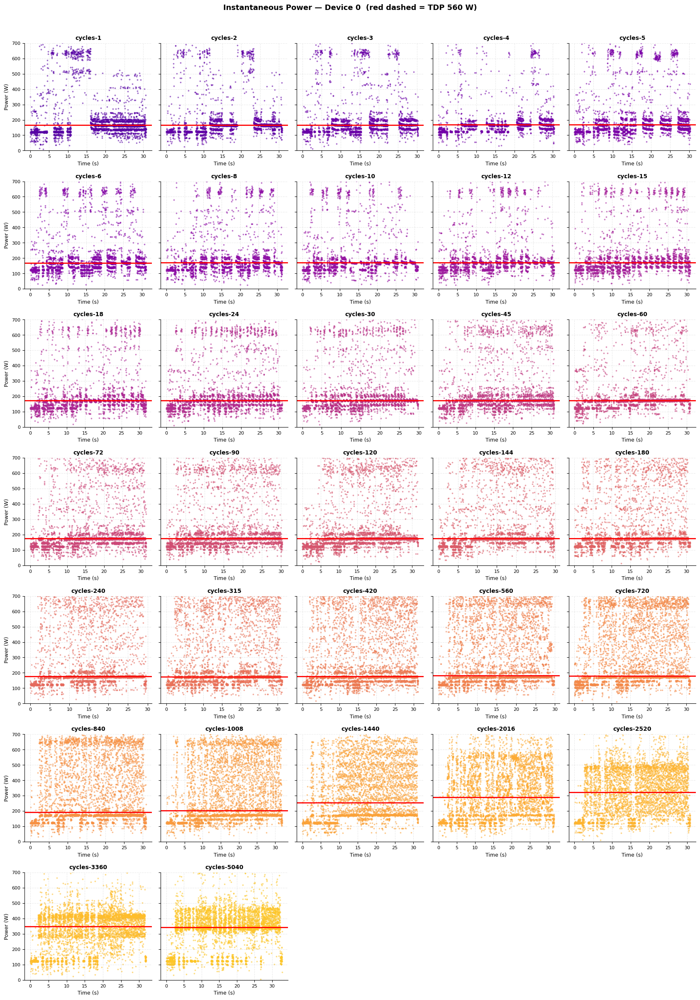

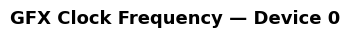

In [21]:
pct_above_tdp      = []
avg_power          = []
pct_time_throttled = []   # filled correctly in the next cell after threshold is known
run_power_data     = []
run_clock_data     = []

for run in ensemble.runs:
    y_p = run.nodes[0].metrics["A2amd_smi:::inst_power:device=0"]
    t_p = np.asarray(y_p.times)
    p   = np.asarray(y_p.values)
    pct_above_tdp.append(float(np.mean(p > TDP)))
    avg_power.append(float(p[p > TDP].mean()) if np.any(p > TDP) else TDP)
    run_power_data.append((t_p, p))

    if "A2rocm_smi:::gpu_clk_freq_System:device=0:current" in run.nodes[0].metrics:
        y_c = run.nodes[0].metrics["A2rocm_smi:::gpu_clk_freq_System:device=0:current"]
        t_c = np.asarray(y_c.times)
        c   = np.asarray(y_c.values)
        run_clock_data.append((t_c, c))

ncols = 5
nrows = (len(ensemble.runs) + ncols - 1) // ncols

# --- Power grid ---
fig, axes = plt.subplots(nrows, ncols, figsize=(17, nrows * 3.4), sharey=True)
fig.suptitle("Instantaneous Power — Device 0  (red dashed = TDP 560 W)",
             fontsize=13, fontweight='bold', y=1.01)
for i, (ax, (t, p)) in enumerate(zip(axes.flat, run_power_data)):
    # ax.plot(t, p)
    ax.scatter(t, np.abs(p), s=3, alpha=0.45, color=PALETTE[i], rasterized=True)
    ax.set_ybound(0, 20000)
    ax.axhline(np.median(np.abs(p)), label="Average", color='red', lw=2)
    ax.set_title(f"cycles-{cycle_counts[i]}", fontsize=10, fontweight='bold')
    ax.set_xlabel("Time (s)", fontsize=9)
    ax.tick_params(labelsize=8)
    if i % ncols == 0:
        ax.set_ylabel("Power (W)", fontsize=9)
for ax in axes.flat[len(run_power_data):]:
    ax.set_visible(False)
plt.ylim(0, 700)
plt.tight_layout()
plt.show()

# --- Clock grid ---
fig, axes = plt.subplots(nrows, ncols, figsize=(17, nrows * 3.4), sharey=True)
fig.suptitle("GFX Clock Frequency — Device 0",
             fontsize=13, fontweight='bold', y=1.01)
for i, (ax, (t, c)) in enumerate(zip(axes.flat, run_clock_data)):
    ax.scatter(t, c, s=3, alpha=0.45, color=PALETTE[i], rasterized=True)
    ax.set_title(f"cycles-{cycle_counts[i]}", fontsize=10, fontweight='bold')
    ax.set_xlabel("Time (s)", fontsize=9)
    ax.tick_params(labelsize=8)
    if i % ncols == 0:
        ax.set_ylabel("GFX Clock (GHz)", fontsize=9)
for ax in axes.flat[len(run_clock_data):]:
    ax.set_visible(False)
plt.tight_layout()
plt.show()

In [22]:
def pct_throttled(t_arr, c_arr):
    """
    Calcula la fracción de tiempo en estado throttled usando vectorización.
    Cálculo analítico exacto en lugar de aproximación por muestreo.
    """
    t = np.asarray(t_arr)
    c = np.asarray(c_arr)
    
    # 1. Calculamos la duración (Δt) de cada intervalo: t[i+1] - t[i]
    dt = np.diff(t)
    
    # 2. Creamos una máscara booleana para los estados "throttled"
    # Usamos c[:-1] porque el valor c[i] se mantiene estable durante el intervalo dt[i]
    is_throttled = (c[:-1] > THROTTLE_LOW) & (c[:-1] < THROTTLE_HIGH)
    
    # 3. Sumamos el tiempo exacto que el sistema pasó en ese estado
    throttled_time = np.sum(dt[is_throttled])
    
    # 4. Calculamos el tiempo total del registro
    total_time = t[-1] - t[0]
    
    return throttled_time / total_time if total_time > 0 else 0.0
pct_time_throttled = [pct_throttled(t, c) for t, c in run_clock_data]

for cyc, pct in zip(cycle_counts, pct_time_throttled):
    print(f"cycles-{cyc:>5}: {pct*100:.1f}% throttled")

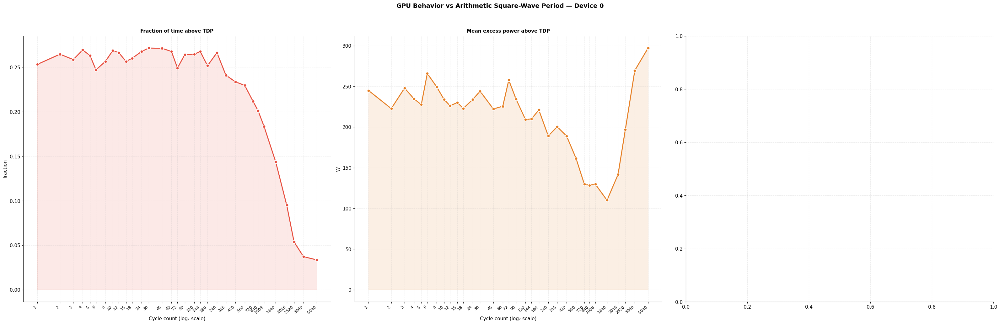

In [23]:
datasets = [
    (pct_above_tdp,
     "Fraction of time above TDP",   "fraction", '#e74c3c'),
    ([x - TDP for x in avg_power],
     "Mean excess power above TDP",  "W",        '#e67e22'),
    (pct_time_throttled,
     "Fraction of time throttled",   "fraction", '#3498db'),
]

fig, axes = plt.subplots(1, 3, figsize=(32, 10))
fig.suptitle("GPU Behavior vs Arithmetic Square-Wave Period — Device 0",
             fontsize=14, fontweight='bold', y=1.03)

for ax, (data, title, unit, color) in zip(axes, datasets):
    if len(data) > 0:
        ax.plot(cycle_counts, data, 'o-', color=color, linewidth=2.2,
                markersize=7, markeredgecolor='white', markeredgewidth=1.5,
                zorder=3)
        ax.fill_between(cycle_counts, data, alpha=0.12, color=color)
        ax.set_xscale('log', base=2)
        ax.set_xticks(cycle_counts)
        ax.set_xticklabels(cycle_counts, rotation=40, ha='right', fontsize=9)
        ax.set_xlabel("Cycle count (log₂ scale)", fontsize=11)
        ax.set_ylabel(unit, fontsize=11)
        ax.set_title(title, fontsize=11, fontweight='bold', pad=8)
        ax.grid(True, which='both', alpha=0.2, linestyle='--')
        ax.spines[['top', 'right']].set_visible(False)

plt.tight_layout()
plt.show()

In [24]:
def analyze_device(device):

    pct_above_tdp      = []
    avg_power          = []
    pct_time_throttled = []   # filled correctly in the next cell after threshold is known
    run_power_data     = []
    run_clock_data     = []

    for run in ensemble.runs:
        y_p = run.nodes[0].metrics[f"A2amd_smi:::inst_power:device={device}"]
        t_p = np.asarray(y_p.times)
        p   = np.asarray(y_p.values)
        pct_above_tdp.append(float(np.mean(p > TDP)))
        avg_power.append(float(p[p > TDP].mean()) if np.any(p > TDP) else TDP)
        run_power_data.append((t_p, p))
        if f"A2amd_smi:::gpu_clk_freq_System:device={device}:current" in run.nodes[0].metrics:
            y_c = run.nodes[0].metrics[f"A2amd_smi:::gpu_clk_freq_System:device={device}:current"]
            t_c = np.asarray(y_c.times)
            c   = np.asarray(y_c.values)
            run_clock_data.append((t_c, c))

    ncols = 5
    nrows = (len(ensemble.runs) + ncols - 1) // ncols

    # --- Power grid ---
    fig, axes = plt.subplots(nrows, ncols, figsize=(17, nrows * 3.4), sharey=True)
    fig.suptitle(f"Instantaneous Power — Device {device}  (red dashed = TDP 560 W)",
                fontsize=13, fontweight='bold', y=1.01)
    for i, (ax, (t, p)) in enumerate(zip(axes.flat, run_power_data)):
        ax.scatter(t, p, s=3, alpha=0.45, color=PALETTE[i], rasterized=True)
        ax.axhline(TDP, color='#e74c3c', linewidth=1.2, linestyle='--', alpha=0.85)
        ax.set_title(f"cycles-{cycle_counts[i]}", fontsize=10, fontweight='bold')
        ax.set_xlabel("Time (s)", fontsize=9)
        ax.tick_params(labelsize=8)
        if i % ncols == 0:
            ax.set_ylabel("Power (W)", fontsize=9)
    for ax in axes.flat[len(run_power_data):]:
        ax.set_visible(False)
    plt.tight_layout()
    plt.show()

    # --- Clock grid ---
    fig, axes = plt.subplots(nrows, ncols, figsize=(17, nrows * 3.4), sharey=True)
    fig.suptitle(f"GFX Clock Frequency — Device {device}",
                fontsize=13, fontweight='bold', y=1.01)
    for i, (ax, (t, c)) in enumerate(zip(axes.flat, run_clock_data)):
        ax.scatter(t, c, s=3, alpha=0.45, color=PALETTE[i], rasterized=True)
        ax.set_title(f"cycles-{cycle_counts[i]}", fontsize=10, fontweight='bold')
        ax.set_xlabel("Time (s)", fontsize=9)
        ax.tick_params(labelsize=8)
        if i % ncols == 0:
            ax.set_ylabel("GFX Clock (GHz)", fontsize=9)
    for ax in axes.flat[len(run_clock_data):]:
        ax.set_visible(False)
    plt.tight_layout()
    plt.show()
    pct_time_throttled = [pct_throttled(t, c) for t, c in run_clock_data]

    for cyc, pct in zip(cycle_counts, pct_time_throttled):
        print(f"cycles-{cyc:>5}: {pct*100:.1f}% throttled")
    datasets = [
        (pct_above_tdp,
        "Fraction of time above TDP",   "fraction", '#e74c3c'),
        ([x - TDP for x in avg_power],
        "Mean excess power above TDP",  "W",        '#e67e22'),
        (pct_time_throttled,
        "Fraction of time throttled",   "fraction", '#3498db'),
    ]

    fig, axes = plt.subplots(1, 3, figsize=(30, 10))
    fig.suptitle(f"GPU Behavior vs Arithmetic Square-Wave Period — Device {device}",
                fontsize=14, fontweight='bold', y=1.03)

    for ax, (data, title, unit, color) in zip(axes, datasets):
        if len(data) == 0:
            continue
        ax.plot(cycle_counts, data, 'o-', color=color, linewidth=2.2,
                markersize=7, markeredgecolor='white', markeredgewidth=1.5,
                zorder=3)
        ax.fill_between(cycle_counts, data, alpha=0.12, color=color)
        ax.set_xscale('log', base=2)
        ax.set_xticks(cycle_counts)
        ax.set_xticklabels(cycle_counts, rotation=40, ha='right', fontsize=9)
        ax.set_xlabel("Cycle count (log₂ scale)", fontsize=11)
        ax.set_ylabel(unit, fontsize=11)
        ax.set_title(title, fontsize=11, fontweight='bold', pad=8)
        ax.grid(True, which='both', alpha=0.2, linestyle='--')
        ax.spines[['top', 'right']].set_visible(False)

    plt.tight_layout()
    plt.show()

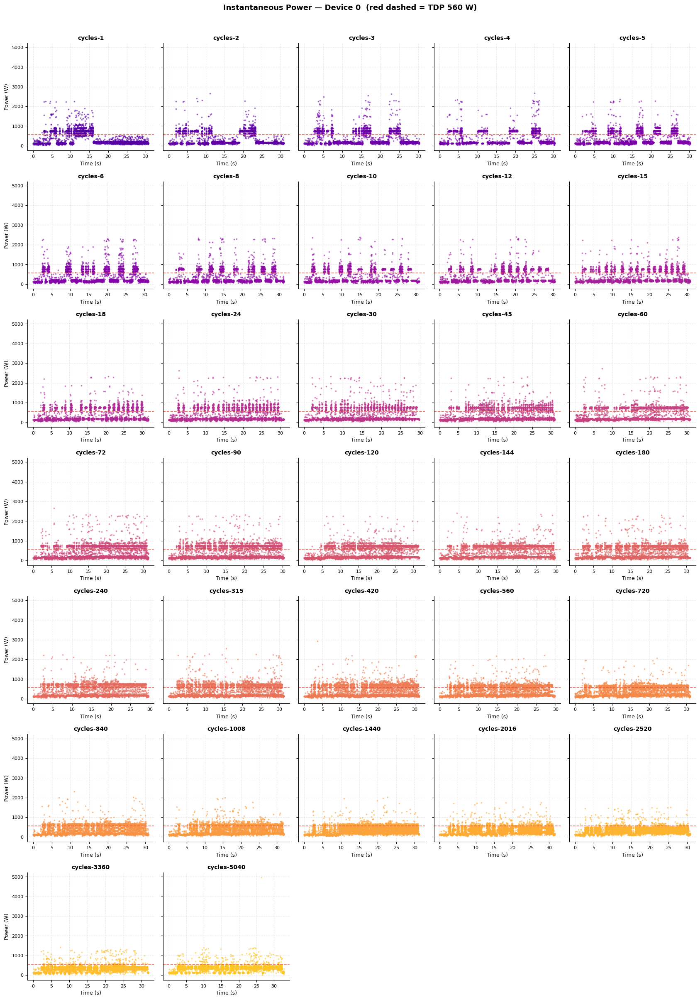

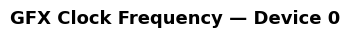

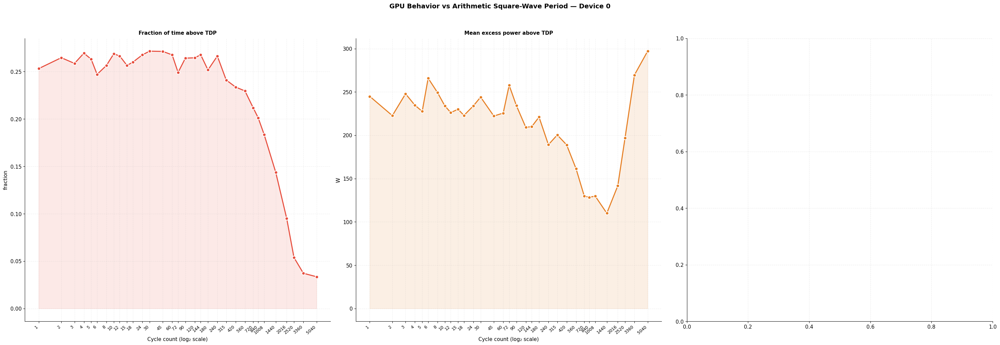

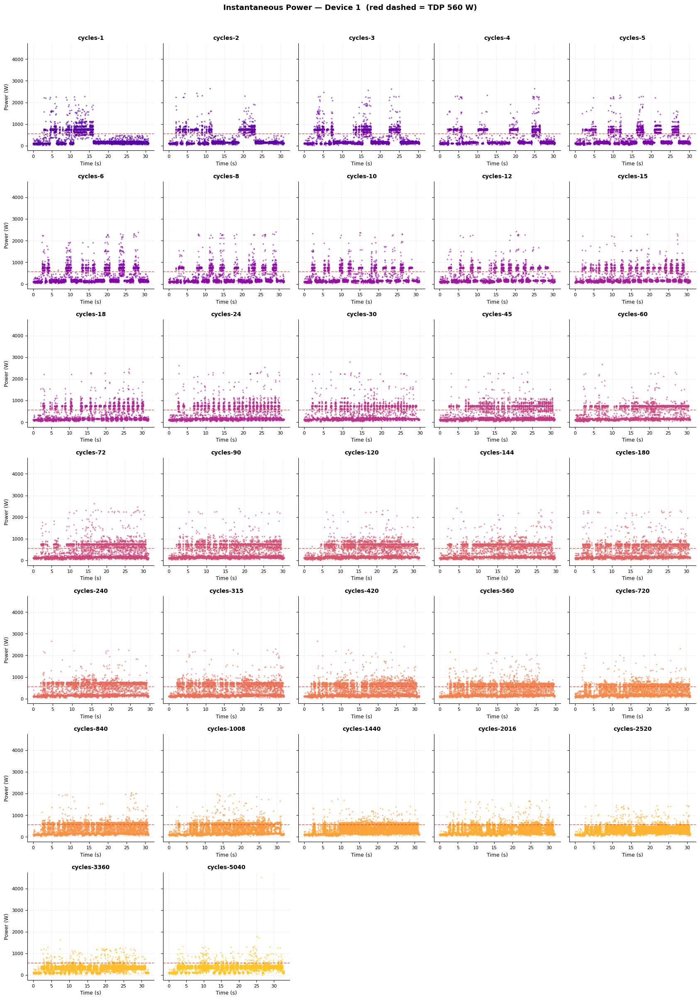

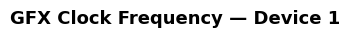

...

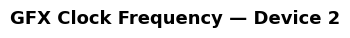

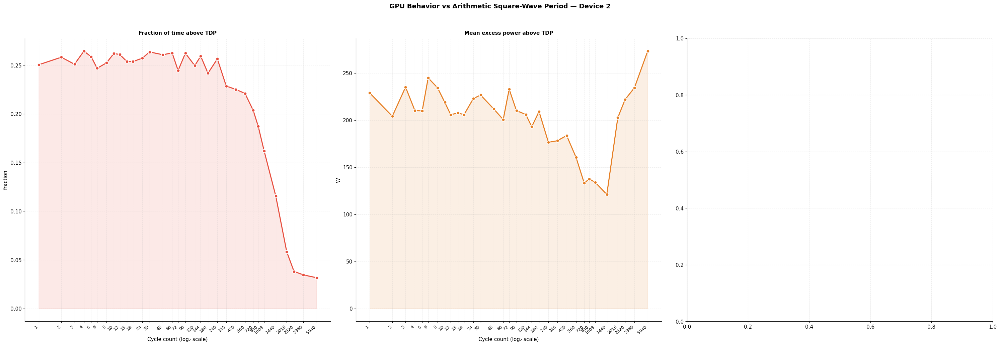

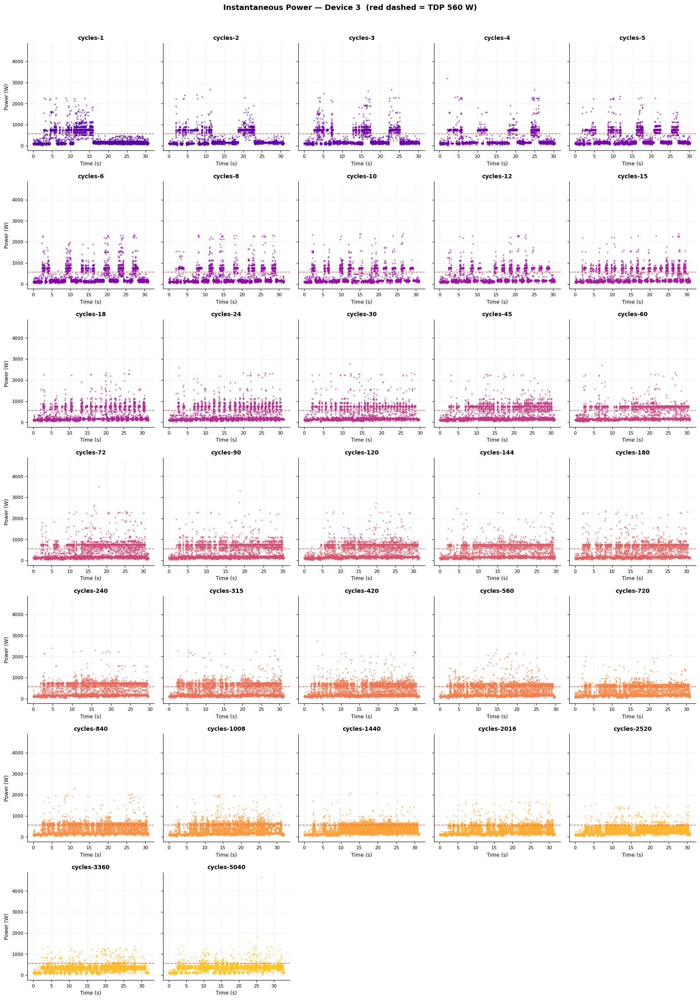

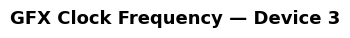

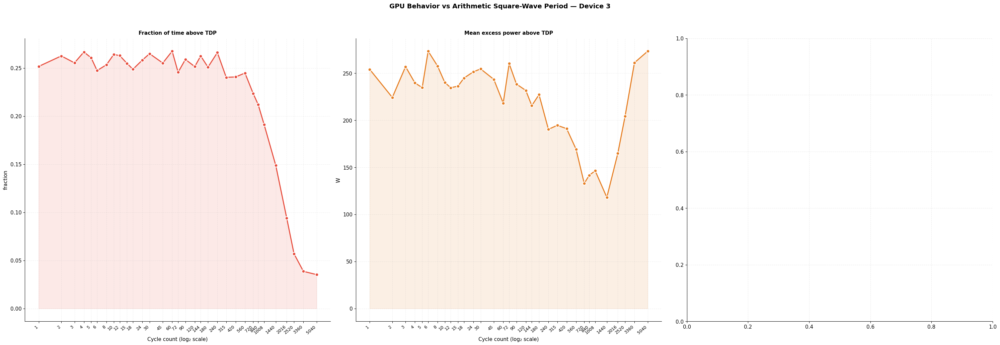

In [25]:
analyze_device(0)
analyze_device(1)
analyze_device(2)
analyze_device(3)

/var/folders/tw/01tr8b7x7qx2w8074rmfk1qc0000gp/T/ipykernel_47790/432155755.py:35: RuntimeWarning: Mean of empty slice
  mean=np.nanmean(stack, axis=0),
/Users/hom/miniconda3/envs/ampere_dev/lib/python3.11/site-packages/numpy/lib/_nanfunctions_impl.py:1593: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a,


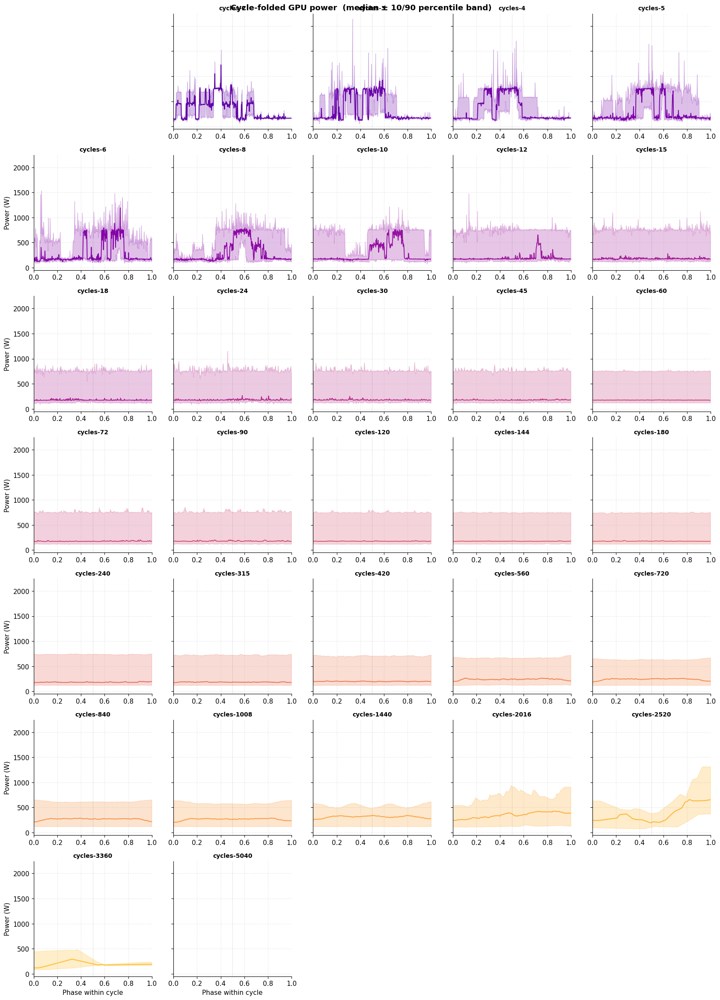

In [26]:
def fold_cycles(t, y, n_cycles, t_skip_head=2.1, t_skip_tail=1.1,
                n_phase_bins=400):
    """Fold a periodic signal onto a single canonical cycle.
    Returns phase grid (0..1), per-cycle stack (n_cycles_used, n_phase_bins),
    mean, p10, p50, p90.
    """
    t = np.asarray(t, dtype=float); y = np.asarray(y, dtype=float)
    mask = (t >= t[0] + t_skip_head) & (t <= t[-1] - t_skip_tail)
    t, y = t[mask], y[mask]
    if len(t) < 64 or n_cycles < 1:
        return None

    duration = t[-1] - t[0]
    period   = duration / n_cycles
    phase    = ((t - t[0]) / period) % 1.0
    cycle_id = ((t - t[0]) // period).astype(int)

    phase_grid = np.linspace(0, 1, n_phase_bins, endpoint=False)
    n_used = int(cycle_id.max())  # drop the last partial cycle
    if n_used < 2:
        return None

    stack = np.full((n_used, n_phase_bins), np.nan)
    for k in range(n_used):
        sel = cycle_id == k
        if sel.sum() < 4:
            continue
        # Sort by phase and resample onto the common grid
        order = np.argsort(phase[sel])
        stack[k] = np.interp(phase_grid, phase[sel][order], y[sel][order])

    return dict(
        phase=phase_grid,
        stack=stack,
        mean=np.nanmean(stack, axis=0),
        p10=np.nanpercentile(stack, 10, axis=0),
        p50=np.nanpercentile(stack, 50, axis=0),
        p90=np.nanpercentile(stack, 90, axis=0),
    )

# Plot for one device across the cycle sweep
ncols = 5
nrows = (len(ensemble.runs) + ncols - 1) // ncols
fig, axes = plt.subplots(nrows, ncols, figsize=(17, nrows * 3.4),
                         sharey=True)
fig.suptitle("Cycle-folded GPU power  (median ± 10/90 percentile band)",
             fontweight='bold')

# for i, (ax, ((t, p), _)) in enumerate(zip(axes.flat, run_node_data)):
for i, (ax, ((t, p), _)) in enumerate(zip(axes.flat, run_gpu_data)):
    folded = fold_cycles(t, p, cycle_counts[i])
    if folded is None:
        ax.set_visible(False); continue
    ax.fill_between(folded['phase'], folded['p10'], folded['p90'],
                    color=PALETTE[i], alpha=0.25)
    ax.plot(folded['phase'], folded['p50'], color=PALETTE[i], lw=1.4)
    ax.axvline(0.5, color='k', lw=0.5, alpha=0.4, ls=':')
    ax.set_title(f"cycles-{cycle_counts[i]}", fontsize=10, fontweight='bold')
    ax.set_xlim(0, 1)
    if i % ncols == 0: ax.set_ylabel("Power (W)")
    if i // ncols == nrows - 1: ax.set_xlabel("Phase within cycle")
for ax in axes.flat[len(ensemble.runs):]:
    ax.set_visible(False)
plt.tight_layout(); plt.show()

In [27]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter1d

N_RUNS = len(cycle_counts)
PALETTE = plt.cm.plasma(np.linspace(0.15, 0.88, N_RUNS))
THROTTLE_LOW, THROTTLE_HIGH = 0.8, 1.7   # GHz - throttle clock band

plt.rcParams.update({
    'axes.spines.top':   False,
    'axes.spines.right': False,
    'axes.grid':         True,
    'grid.alpha':        0.25,
    'grid.linestyle':    '--',
    'font.size':         11,
})


def fold_cycles(t, y, n_cycles, t_skip_head=3.0, t_skip_tail=1.0,
                n_phase_bins=400):
    """Fold N cycles of a periodic signal onto one canonical cycle.
    Phase 0 will be wherever t_skip_head landed in the cycle — call
    align_folded() afterward to roll it to a consistent convention."""
    t = np.asarray(t, dtype=float); y = np.asarray(y, dtype=float)
    mask = (t >= t[0] + t_skip_head) & (t <= t[-1] - t_skip_tail)
    t, y = t[mask], y[mask]
    if len(t) < 64 or n_cycles < 1:
        return None
    duration = t[-1] - t[0]
    period = duration / n_cycles
    phase = ((t - t[0]) / period) % 1.0
    cycle_id = ((t - t[0]) // period).astype(int)
    phase_grid = np.linspace(0, 1, n_phase_bins, endpoint=False)
    n_used = max(1, int(cycle_id.max()))
    stack = np.full((n_used, n_phase_bins), np.nan)
    for k in range(n_used):
        sel = cycle_id == k
        if sel.sum() < 4:
            continue
        order = np.argsort(phase[sel])
        ph_k = phase[sel][order]; y_k = y[sel][order]
        _, uniq = np.unique(ph_k, return_index=True)
        if len(uniq) < 4:
            continue
        stack[k] = np.interp(phase_grid, ph_k[uniq], y_k[uniq])
    if np.all(np.isnan(stack)):
        return None
    return dict(
        phase=phase_grid, period_s=period, stack=stack,
        median=np.nanmedian(stack, axis=0),
        p10=np.nanpercentile(stack, 10, axis=0),
        p25=np.nanpercentile(stack, 25, axis=0),
        p75=np.nanpercentile(stack, 75, axis=0),
        p90=np.nanpercentile(stack, 90, axis=0),
        n_cycles_used=int(np.sum(~np.all(np.isnan(stack), axis=1))),
    )


def align_folded(folded, convention='cold_first', min_swing_W=30.0):
    """Roll a folded result so phase 0 lines up consistently across runs.

    convention='cold_first': phase 0 = start of cold (low) half;
                              phase 0.5 = transition to hot (high) half.
    convention='hot_first':  the opposite.

    Method: circular cross-correlation between the folded median and an
    ideal square-wave reference. The shift that maximizes correlation
    is the shift that best matches the requested convention.

    Returns a new dict with all per-phase arrays rolled, plus:
      - 'phase_shift':    integer index shift applied (= np.argmax(corr))
      - 'align_quality':  0..1 score for how square-wave-like the
                          aligned median is (close to 1 = clean square,
                          near 0 = no clear pattern)
      - 'detected_swing_W': peak-to-peak of the median, used to decide
                            whether to attempt alignment at all
    """
    if folded is None:
        return None
    median = folded['median']
    n = len(median)
    m = np.nan_to_num(median, nan=np.nanmean(median))
    m_centered = m - m.mean()
    swing = float(np.nanmax(median) - np.nanmin(median))

    # No appreciable swing → alignment would just amplify noise; leave as-is
    if swing < min_swing_W or n < 8:
        out = dict(folded)
        out['phase_shift'] = 0
        out['align_quality'] = 0.0
        out['detected_swing_W'] = swing
        return out

    # Reference square wave for the requested convention
    half = n // 2
    if convention == 'cold_first':
        ref = np.concatenate([-np.ones(half), np.ones(n - half)])
    elif convention == 'hot_first':
        ref = np.concatenate([np.ones(half), -np.ones(n - half)])
    else:
        raise ValueError("convention must be 'cold_first' or 'hot_first'")

    # Circular cross-correlation via FFT
    M = np.fft.fft(m_centered); R = np.fft.fft(ref)
    corr = np.real(np.fft.ifft(M * np.conj(R)))
    best_lag = int(np.argmax(corr))

    # Quality score: peak correlation / sum of |m| (= correlation if every
    # sample agreed in sign with the reference)
    max_possible = np.sum(np.abs(m_centered))
    quality = float(corr[best_lag] / max_possible) if max_possible > 0 else 0.0

    out = dict(folded)
    for key in ('median', 'p10', 'p25', 'p75', 'p90'):
        if key in folded:
            out[key] = np.roll(folded[key], -best_lag)
    if 'stack' in folded and folded['stack'] is not None:
        out['stack'] = np.roll(folded['stack'], -best_lag, axis=1)
    out['phase_shift'] = best_lag
    out['align_quality'] = quality
    out['detected_swing_W'] = swing
    return out


def fold_and_align(t, y, n_cycles, n_phase_bins=400,
                   convention='cold_first', min_swing_W=30.0,
                   t_skip_head=3.0, t_skip_tail=1.0):
    """Convenience: fold + align in one call."""
    folded = fold_cycles(t, y, n_cycles, t_skip_head=t_skip_head,
                         t_skip_tail=t_skip_tail, n_phase_bins=n_phase_bins)
    return align_folded(folded, convention=convention,
                        min_swing_W=min_swing_W)


def f0_of_run(i):
    (gpu_t, _), _ = run_node_data[i]
    return cycle_counts[i] / (gpu_t[-1] - gpu_t[0])


In [28]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter1d

N_RUNS = len(cycle_counts)
PALETTE = plt.cm.plasma(np.linspace(0.15, 0.88, N_RUNS))
THROTTLE_LOW, THROTTLE_HIGH = 0.8, 1.7   # GHz - throttle clock band

plt.rcParams.update({
    'axes.spines.top':   False,
    'axes.spines.right': False,
    'axes.grid':         True,
    'grid.alpha':        0.25,
    'grid.linestyle':    '--',
    'font.size':         11,
})


def fold_cycles(t, y, n_cycles, t_skip_head=3.0, t_skip_tail=1.0, n_phase_bins=400):
    """
    Fold N cycles of a periodic signal onto one canonical cycle.
    Optimized to find the best-fit period and prevent phase drift.
    """
    t = np.asarray(t, dtype=float)
    y = np.asarray(y, dtype=float)
    
    mask = (t >= t[0] + t_skip_head) & (t <= t[-1] - t_skip_tail)
    t, y = t[mask], y[mask]
    
    if len(t) < 64 or n_cycles < 1:
        return None
        
    duration = t[-1] - t[0]
    
    # 1. Estimación inicial del período
    naive_period = duration / n_cycles
    
    # 2. Función objetivo: Maximizar la varianza del perfil plegado
    # Un perfil bien alineado tendrá bordes definidos y alta varianza.
    # Un perfil desfasado se aplanará y tendrá baja varianza.
    def objective(p):
        ph = ((t - t[0]) / p) % 1.0
        # Usamos menos bins (ej. 50) para la optimización para que sea rápido y robusto
        means, _, _ = binned_statistic(ph, y, statistic='mean', bins=50)
        # Queremos maximizar la varianza, por lo que minimizamos su valor negativo
        return -np.nanvar(means)
        
    # 3. Encontrar el período de mejor ajuste (margen de error del ±5%)
    res = minimize_scalar(
        objective, 
        bounds=(naive_period * 0.95, naive_period * 1.05), 
        method='bounded'
    )
    
    best_period = res.x if res.success else naive_period
    
    # 4. Usar el período optimizado para el plegado final
    phase = ((t - t[0]) / best_period) % 1.0
    cycle_id = ((t - t[0]) // best_period).astype(int)
    
    phase_grid = np.linspace(0, 1, n_phase_bins, endpoint=False)
    n_used = max(1, int(cycle_id.max()) + 1) # Asegurar incluir el último ciclo
    stack = np.full((n_used, n_phase_bins), np.nan)
    
    for k in range(n_used):
        sel = cycle_id == k
        if sel.sum() < 4:
            continue
        order = np.argsort(phase[sel])
        ph_k = phase[sel][order]
        y_k = y[sel][order]
        
        _, uniq = np.unique(ph_k, return_index=True)
        if len(uniq) < 4:
            continue
            
        stack[k] = np.interp(phase_grid, ph_k[uniq], y_k[uniq])
        
    if np.all(np.isnan(stack)):
        return None
        
    return dict(
        phase=phase_grid, 
        period_s=best_period, # Período corregido
        stack=stack,
        median=np.nanmedian(stack, axis=0),
        p10=np.nanpercentile(stack, 10, axis=0),
        p25=np.nanpercentile(stack, 25, axis=0),
        p75=np.nanpercentile(stack, 75, axis=0),
        p90=np.nanpercentile(stack, 90, axis=0),
        n_cycles_used=int(np.sum(~np.all(np.isnan(stack), axis=1))),
    )

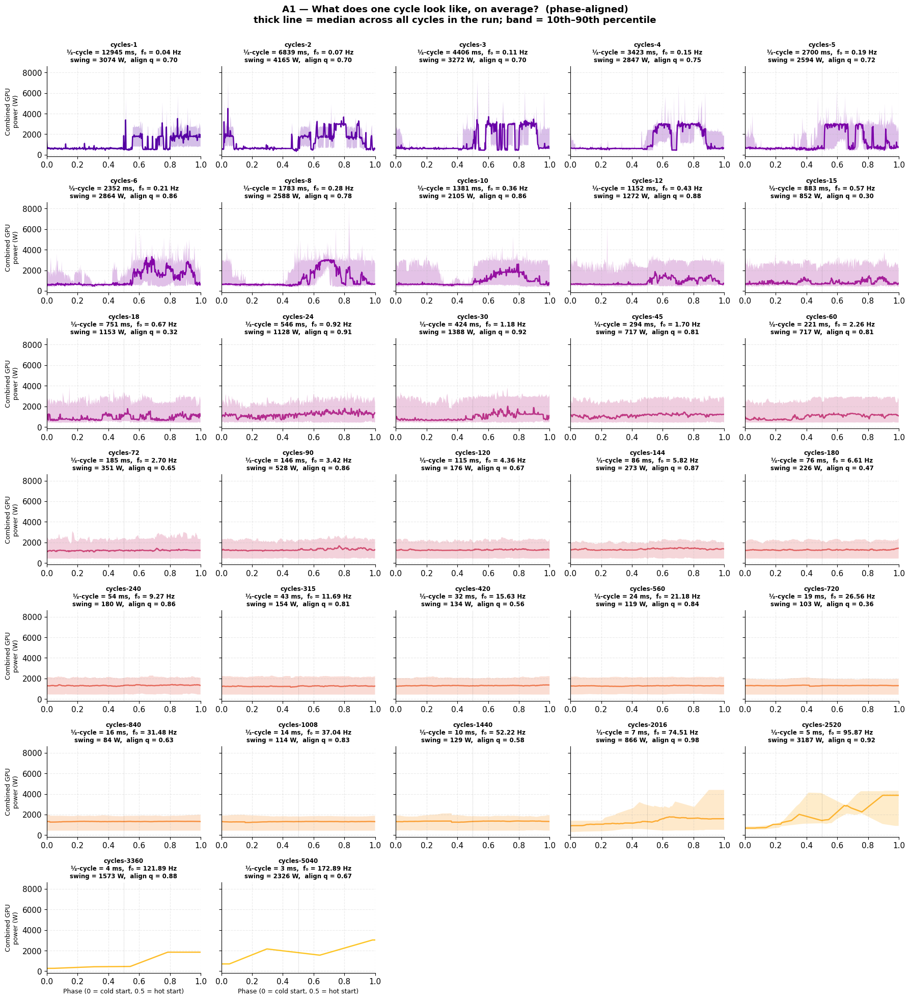

In [29]:
ncols = 5
nrows = (N_RUNS + ncols - 1) // ncols
fig, axes = plt.subplots(nrows, ncols, figsize=(18, nrows * 2.8), sharey=True)
fig.suptitle("A1 — What does one cycle look like, on average?  (phase-aligned)\n"
             "thick line = median across all cycles in the run; band = 10th–90th percentile",
             fontweight='bold', y=1.00)

for i, ax in enumerate(axes.flat):
    if i >= N_RUNS:
        ax.set_visible(False); continue
    (gpu_t, gpu_p), _ = run_node_data[i]
    folded = fold_and_align(gpu_t, gpu_p, cycle_counts[i],
                            convention='cold_first')
    if folded is None:
        ax.set_visible(False); continue
    ax.fill_between(folded['phase'], folded['p10'], folded['p90'],
                    color=PALETTE[i], alpha=0.25, lw=0)
    ax.plot(folded['phase'], folded['median'], color=PALETTE[i], lw=1.8)
    ax.axvline(0.5, color='k', lw=0.5, ls=':', alpha=0.4)
    period_ms = folded['period_s'] * 1000
    q  = folded.get('align_quality', 0.0)
    sw = folded.get('detected_swing_W', 0.0)
    ax.set_title(f"cycles-{cycle_counts[i]}\n"
                 f"½-cycle = {period_ms/2:.0f} ms,  f₀ = {1/folded['period_s']:.2f} Hz\n"
                 f"swing = {sw:.0f} W,  align q = {q:.2f}",
                 fontsize=8.5, fontweight='bold')
    if i % ncols == 0:
        ax.set_ylabel("Combined GPU\npower (W)", fontsize=9)
    if i // ncols == nrows - 1:
        ax.set_xlabel("Phase (0 = cold start, 0.5 = hot start)", fontsize=9)
    ax.set_xlim(0, 1)

plt.tight_layout()
plt.show()
